# Figure 2 — Muller plots of clonal evolution preceding AML

This notebook reproduces the **Muller plots** of **Figure 2** (10 pre-AML cases illustrating
"linear evolution", "clonal interference" and "late evolution") together with the supplementary
Muller plots for all cases and controls. In each plot the vertical extent of a band is the
fraction of cells belonging to that clone, with nested bands showing daughter clones within their
parent, across age (x-axis). Colour denotes the number of observed driver mutations in a clone
(dark grey = wild-type); white dashed lines mark blood-sample timings, the thick grey dashed line
marks AML diagnosis, and grey arrows mark any MDS/CMML/MPN diagnosis or pre-AML chemotherapy (see
Supplementary Table 10).

## Data availability

Several of the input files below are **individual-level participant data** and are **not distributed with this code**.  They are available under controlled access, deposited in the European Genome-phenome Archive (EGA) and released to approved researchers via a Data Access Committee administered by the corresponding authors.

| file | used for | location |
|---|---|---|
| `UKCTOCS_samples_processed_information.csv` | sample ages and diagnosis ages (plot x-axis) | EGA |
| `Other_haem_diagnososes_chemo_smoking_information.csv` | clinical events annotated on the plots | EGA |
| `Phylogeny_csvs/*_phylogenies_without_missing_drivers_for_muller_rounded_ages.csv` | inferred clonal phylogenies | Data_files |

**Note on the phylogeny inputs**: The Muller plots read Data_files/Phylogeny_csvs/<sample>_phylogenies_without_missing_drivers_for_muller_rounded_ages.csv. These are derived from the output of the 'Acquisition age fitness inference' code, not that output verbatim: the age first detected column has been rounded to whole years, because the original values are exact participant ages. That column is used only to order clones within the plot, so the clone ordering is unchanged. All other columns, including cell_fractions and max cell fraction, are the inference output unchanged. The unrounded values are not distributed as they correspond to the exact ages at sample collection, which are available under controlled access via the EGA.

The somatic variant calls underlying the phylogenies are published in **Supplementary Tables 6 and 7**; the clinical events annotated on the plots (MDS/CMML/MPN, chemotherapy) are detailed in **Supplementary Table 10**. 

## 1. Imports and plotting style

In [1]:
import csv
import ast
import re
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
%matplotlib inline

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'Helvetica'

## 2. Colours

Clones are coloured by the number of driver mutations they carry (`mutation_number_colors`);
greys are used for wild-type cells, axes and annotations.

In [2]:
grey1, grey2, grey3, grey4, grey5 = '#f7f7f7', '#cccccc', '#969696', '#636363', '#252525'

# clone colour by number of observed driver mutations (0 = wild-type)
mutation_number_colors = {0: [grey2],
                          1: ['#4292c6', '#6baed6', '#9ecae1', '#deebf7', '#08306b', '#08519c'],
                          2: ['#74c476', '#a1d99b', '#c7e9c0', '#e5f5e0', '#238b45'],
                          3: ['#feb24c', '#fed976', '#ffeda0', '#ffffcc'],
                          4: ['#cb181d', '#ef3b2c', '#fb6a4a', '#fc9272', '#791614'],
                          5: ['#834594', '#520e72'],
                          6: ['#67001f']}

## 3. Assign clone colours

Each clone is given the next colour in the palette for its mutation number. Clones whose mutation
number is in `keep_counts` keep the colour already stored in the phylogeny CSV (used for the two
cases where a specific mutation number was coloured by hand to match its trajectory plot).

In [3]:
def assign_clone_colours(phylogeny, keep_counts=()):
    used = {}
    coloured = {}
    for k, v in phylogeny.items():
        n = v['mutations_in_clone']
        if n not in keep_counts:
            i = used.get(n, -1) + 1
            v['variant color'] = mutation_number_colors[n][i]
            used[n] = i
        coloured[k] = v
    return coloured

## 4. Muller-plot construction

- Using phylogeny csv files derived from 'Acquisition age fitness inference' code, e.g. 'C92_003_phylogenies_without_missing_drivers_for_muller_rounded_ages.csv' (see note at top of notebook)
- Some muller plots require subsequent trajectory position adjustment in Adobe Illustrator (e.g. if overlapping on plot).

In [4]:
def convert_to_list(column):
    new_list = ast.literal_eval(column)
    return new_list

In [5]:
def retrieve_phylogeny(sample_name):
    df = pd.read_csv('Data_files/Phylogeny_csvs/'+sample_name+'_phylogenies_without_missing_drivers_for_muller_rounded_ages.csv', 
                     header = 0, 
                     names= ['mutation', 'parent', 'siblings', 'descendents', 'parent_descendents', 'mutations_in_clone', 
                             'cell_fractions', 'age first detected', 'max cell fraction', 'variant color'])
    df['cell_fractions'] = df['cell_fractions'].apply(convert_to_list)
    df['siblings'] = df['siblings'].apply(convert_to_list)
    df['descendents'] = df['descendents'].apply(convert_to_list)
    df['parent'] = df['parent'].fillna("")
    df = df.set_index('mutation')
    df = df.sort_values(by=['mutations_in_clone', 'age first detected'], ascending=True)
    phylogeny = pd.DataFrame.to_dict(df, orient = 'index')
    return phylogeny

In [6]:
def add_midline_shift(phylogeny, shift_list): #[0, 0, 0, 0, 0] in the order of the variants in the phylogeny
    n=0
    phylogeny_midline_shift = {}
    for k, v in phylogeny.items():
        v_dict = v
        v_dict['midline_shift']=shift_list[n]
        phylogeny_midline_shift[k]=v_dict
        n+=1
    return phylogeny_midline_shift

In [7]:
def cell_fraction_timepoints(phylogeny, ages):
    timepoints = {}
    for k, v in phylogeny.items():
        if len(v['cell_fractions']) != len(ages): #zip would silently drop the tail and shift everything after a gap
            raise ValueError(k+': '+str(len(v['cell_fractions']))+' cell fractions but '+str(len(ages))+' ages')
        timepoint_cell_fractions = {}
        for age, cell_fraction in zip(ages, v['cell_fractions']):
            timepoint_cell_fractions[age]=cell_fraction
        timepoints[k]=timepoint_cell_fractions
    return timepoints

In [ ]:
def Muller_plot_v3_muller_colours(timepoints, phylogeny, sample_name, diagnosis_age, other_history):
    fig, ax1 = plt.subplots(1, 1, figsize = (20, 5.6))

    #Plot setup
    for axis in ['top','right']:
        ax1.spines[axis].set_visible(False)  
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(1.5)
        ax1.spines[axis].set_color(grey3)
    ax1.set_ylim(0, 100)
    ax1.set_xlabel('age', fontsize = 18)
    plt.xticks(fontsize = 18)

    sibling_present = {}
    lines_plotted = {}
    descendents_shifted = {}
    
    timepoints_undetectable = {}

    helvetica_5 = 26
    helvetica_6 = 30
    
    for k, v in timepoints.items():
#         print('variant = ', k)
        parent = phylogeny[k]['parent'] #what the parent clone is
#         colour = phylogeny[k]['colour']
        colour = phylogeny[k]['variant color']
        descendents = phylogeny[k]['descendents'] #what the descendents of the clone are
        parent_descendents = phylogeny[k]['parent_descendents'] #how many ancestor clones it's parent clone has
        midline_shift = phylogeny[k]['midline_shift']
        list_of_siblings = phylogeny[k]['siblings']
        number_siblings= len(list_of_siblings)
        number_mutations = phylogeny[k]['mutations_in_clone']
        top_line = []
        bottom_line = []
        midlines = []
        ages = []

        if (k != 'stem cells') and (parent != 'stem cells'):
            if parent in sibling_present.keys(): #look to see if the other clone from the parent is already plotted
                number_of_siblings_already_plotted = sibling_present[parent]
            else:
                number_of_siblings_already_plotted = 0
            
            position_parent_not_zero=[]
            j=0
            for top_pos in lines_plotted[parent][0]: #the top line positions plotted for the parent - want to find the first one that isn't zero
                if np.isnan(top_pos):
#                     print('parent top = np.nan')
                    parentisnantop=0 #just something to write in the if loop
                else:
#                     print('parent top is not nan at =', j)
                    position_parent_not_zero.append(j)
                j+=1
                
            first_position_parent_not_zero = position_parent_not_zero[0]

            parent_top = lines_plotted[parent][0][first_position_parent_not_zero]
            parent_bottom = lines_plotted[parent][1][first_position_parent_not_zero]
            #find the y-axis value to start the clonal trajectory from...
            
            center_line = parent_top-(((parent_top-parent_bottom)/(parent_descendents+1))*(number_of_siblings_already_plotted+1))

            if parent in sibling_present.keys(): #record that the offspring of one of the parents has been plotted
                sibling_present[parent]+=1
            else:
                sibling_present[parent]=1

        n=0
#         print(v)
        for age, cell_fraction in v.items():
            if cell_fraction==0:
                if k in timepoints_undetectable.keys():
                    timepoints_undetectable[k].append(age)
                else:
                    timepoints_undetectable[k]=[age]
#             print()
#             print('age = ', age)
            if (k != 'stem cells') and (parent != 'stem cells'):
                ages.append(age)
                descendents_cell_fraction = 0

                if len(descendents)>0: #add the cell fraction of the descendents at that time point to it's cell fraction
                    for i in descendents:
                        ancestor_cell_fraction = timepoints[i][age]
                        if np.isnan(ancestor_cell_fraction):
                            ancestor_cell_fraction = 0
                        descendents_cell_fraction+=ancestor_cell_fraction

                top = center_line+midline_shift+((cell_fraction+descendents_cell_fraction)/2)
                bottom = center_line+midline_shift-((cell_fraction+descendents_cell_fraction)/2)

                parent_top = lines_plotted[parent][0][n]
                parent_bottom = lines_plotted[parent][1][n]
                parent_midpoint = lines_plotted[parent][2][n]

                if np.isnan(parent_top):
                    parent_top = np.nan
                else: #if the top isn't nan
                    if (top > parent_top) or (bottom < parent_bottom):
                        top = parent_midpoint+((cell_fraction+descendents_cell_fraction)/2)
                        bottom = parent_midpoint-((cell_fraction+descendents_cell_fraction)/2)

                for sibling in list_of_siblings:
                    if sibling in lines_plotted.keys():
                        sibling_bottom = lines_plotted[sibling][1][n]
                        if sibling_bottom<top:#if the clone already plotted above is extending below where the top would be plotted....
                            difference = top-sibling_bottom
                            midline_shift = midline_shift-difference
                            top = top-difference
                            bottom = bottom-difference
                            if k in descendents_shifted.keys():
                                descendents_shifted[k][age]=difference
                            else:
                                descendents_shifted[k]={}
                                descendents_shifted[k][age]=difference

                if top ==center_line+midline_shift:
                    top = np.nan
                if bottom == center_line+midline_shift:
                    bottom = np.nan

                top_line.append(top)
                bottom_line.append(bottom)
                midlines.append(center_line+midline_shift)

            if k == 'stem cells':
                ages.append(age)
                top_line.append(100)
                bottom_line.append(0)
                midlines.append(50)

            if parent == 'stem cells':
#                 print('parent = stem cells')
                ages.append(age)
                cell_fraction = timepoints[k][age]

                midpoints_for_all_siblings = list(np.linspace(100/(number_siblings+2), 100-(100/(number_siblings+2)), number_siblings+1))
                midpoints_for_all_siblings = midpoints_for_all_siblings[::-1]
#                 print('midlines for all siblings = ', midpoints_for_all_siblings)

                number_of_siblings_plotted = 0
                for i in list_of_siblings:
                    if i in lines_plotted.keys():
                        number_of_siblings_plotted+=1

                descendents_cell_fraction = 0
                if len(descendents)>0: #add the cell fraction of the descendents at that time point to it's cell fraction
                    for i in descendents:
                        ancestor_cell_fraction = timepoints[i][age]
                        descendents_cell_fraction+=ancestor_cell_fraction

                total_cell_fraction = cell_fraction+descendents_cell_fraction

                midline = midpoints_for_all_siblings[number_of_siblings_plotted]

                top_line.append(midline+midline_shift+total_cell_fraction/2)
                bottom_line.append(midline+midline_shift-total_cell_fraction/2)
                midlines.append(midline+midline_shift)

            n+=1

        lines_plotted[k]=(top_line, bottom_line, midlines)

        ages2 = []
        top_line2 = []
        bottom_line2 = []

        if (number_mutations==1) and (len(descendents)==0) and (k in timepoints_undetectable.keys()):
            # print(k+' has 1 mutation and no descendents')
            undetectable_timepoints = timepoints_undetectable[k]
            # print('undetectable timepoints = ', undetectable_timepoints)
            for age, top, bottom in zip(ages, top_line, bottom_line):
                if np.isnan(top) == False:
                    if age not in undetectable_timepoints:
                        if top != bottom:
                            ages2.append(age)
                            top_line2.append(top)
                            bottom_line2.append(bottom)
        else:
            for age, top, bottom in zip(ages, top_line, bottom_line):
                if np.isnan(top) == False:
                    if top != bottom:
                        ages2.append(age)
                        top_line2.append(top)
                        bottom_line2.append(bottom)
                        
        xlimits = ax1.get_xlim()
        xmin = xlimits[0]
        xmax = xlimits[1]
        thick_line = 0.0075*(xmax-xmin) #so line thickness of single timepoint mutation will be same across plots
#         print('thick line = ', thick_line)
                    
        if len(ages2)>1:
            ax1.plot(ages2, top_line2, color = 'white', lw = 2)
            ax1.plot(ages2, bottom_line2, color = 'white', lw = 2)
            ax1.fill_between(ages2, top_line2, bottom_line2, color=colour, label = k)
        else:
            # print(k+' only present at one age') #make the line thicker so easier to see
            ages = [ages2[0]-thick_line, ages2[0]]
            ax1.plot(ages, [top_line2[0], top_line2[0]] , color = 'white', lw = 2)
            ax1.plot(ages, [bottom_line2[0], bottom_line2[0]], color = 'white', lw = 2)
            ax1.fill_between(ages, [top_line2[0], top_line2[0]], [bottom_line2[0], bottom_line2[0]], color=colour, label = k)

    #plot other history, chemo etc...
    if sample_name in other_history.keys():
        sample_histories = other_history[sample_name]

        if 'other_haem_Dx' in sample_histories.keys():
            other_haem_Dx = sample_histories['other_haem_Dx']
            for i in other_haem_Dx:
                # print(i)
                diagnosis = i[0].split(' ')[0]
                age = i[1]

                ax1.annotate('', xy=(age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(age, 112, diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)

        if 'chemo' in sample_histories.keys():
            chemo_hx = sample_histories['chemo']
            for i in chemo_hx:
                chemotherapy = i[0]
                chemotherapy_age = i[1]
                ax1.annotate('', xy=(chemotherapy_age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(chemotherapy_age, 112, chemotherapy, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)

        if 'cancer' in sample_histories.keys():
            cancer_Dx = sample_histories['cancer']
            for i in cancer_Dx:
                # print(i)
                cancer_diagnosis = i[0]
                cancer_age = i[1]

                ax1.annotate('', xy=(cancer_age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(cancer_age, 112, cancer_diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)



    ax1.legend(loc='upper left', bbox_to_anchor=(1.02, 1.0), fontsize = 16)

    #plot diagnosis age
    ax1.plot([diagnosis_age, diagnosis_age], [0, 100], color = '#333333', lw = 4, linestyle = '--', zorder = 150)
    for time in ages_list:
        ax1.plot([time, time], [0, 100], color = '#f7f7f7', lw = 3, linestyle = ':', alpha = 1.0, zorder = 50)  

    ax1.set_yticks([])
    ax1.yaxis.set_minor_locator(MultipleLocator(25))
    y_major_ticks = [0, 100]
    y_major_tick_labels = ["0", "100"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)
    
    xlimits = ax1.get_xlim()
    xmin = xlimits[0]
    xmax = xlimits[1]
    ax1.fill_between([xmin, xmax], [0, 0], [100, 100], color = grey1, zorder = 0)
    ax1.set_xlim(xmin, xmax)
    
    ax1.set_xlabel('age', fontsize = helvetica_6)
    ax1.set_ylabel('fraction of cells (%)', fontsize = helvetica_6, labelpad = -55)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.tick_params(axis = 'both', which='major', length=6, width=1.5, color = '#969696', labelsize=helvetica_6)
    ax1.tick_params(axis = 'y', which='minor', length=6, width=1.5, color = '#969696', labelsize=helvetica_6)
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(1.5)
        ax1.spines[axis].set_color('#969696')
        
    if sample_name in linear_evolution:
        evolution_pattern = 'linear evolution'
    elif sample_name in clonal_interference:
        evolution_pattern = 'clonal interference'
    elif sample_name in late_evolution:
        evolution_pattern = 'late evolution'
    else:
        evolution_pattern = ''
    
    ax1.text(0.99, 0.02, sample_name+': ', transform=ax1.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
#     plt.tight_layout()

    return plt.show()

In [ ]:
def Muller_plot_v3_muller_colours_no_legend(timepoints, phylogeny, sample_name, diagnosis_age, other_history):
    fig, ax1 = plt.subplots(1, 1, figsize = (22.5, 6.5))

    #Plot setup
    for axis in ['top','right']:
        ax1.spines[axis].set_visible(False)  
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(1.5)
        ax1.spines[axis].set_color(grey3)
    ax1.set_ylim(0, 100)
    ax1.set_xlabel('age', fontsize = 18)
    plt.xticks(fontsize = 18)

    sibling_present = {}
    lines_plotted = {}
    descendents_shifted = {}
    
    timepoints_undetectable = {}

    helvetica_4 = 25
    helvetica_5 = 29
    helvetica_6 = 35
    
    for k, v in timepoints.items():
#         print('variant = ', k)
        parent = phylogeny[k]['parent'] #what the parent clone is
#         colour = phylogeny[k]['colour']
        colour = phylogeny[k]['variant color']
        descendents = phylogeny[k]['descendents'] #what the descendents of the clone are
        parent_descendents = phylogeny[k]['parent_descendents'] #how many ancestor clones it's parent clone has
        midline_shift = phylogeny[k]['midline_shift']
        list_of_siblings = phylogeny[k]['siblings']
        number_siblings= len(list_of_siblings)
        number_mutations = phylogeny[k]['mutations_in_clone']
        top_line = []
        bottom_line = []
        midlines = []
        ages = []

        if (k != 'stem cells') and (parent != 'stem cells'):
            if parent in sibling_present.keys(): #look to see if the other clone from the parent is already plotted
                number_of_siblings_already_plotted = sibling_present[parent]
            else:
                number_of_siblings_already_plotted = 0
            
            position_parent_not_zero=[]
            j=0
            for top_pos in lines_plotted[parent][0]: #the top line positions plotted for the parent - want to find the first one that isn't zero
                if np.isnan(top_pos):
#                     print('parent top = np.nan')
                    parentisnantop=0 #just something to write in the if loop
                else:
#                     print('parent top is not nan at =', j)
                    position_parent_not_zero.append(j)
                j+=1
                
            first_position_parent_not_zero = position_parent_not_zero[0]

            parent_top = lines_plotted[parent][0][first_position_parent_not_zero]
            parent_bottom = lines_plotted[parent][1][first_position_parent_not_zero]
            #find the y-axis value to start the clonal trajectory from...
            
            center_line = parent_top-(((parent_top-parent_bottom)/(parent_descendents+1))*(number_of_siblings_already_plotted+1))

            if parent in sibling_present.keys(): #record that the offspring of one of the parents has been plotted
                sibling_present[parent]+=1
            else:
                sibling_present[parent]=1

        n=0
#         print(v)
        for age, cell_fraction in v.items():
            if cell_fraction==0:
                if k in timepoints_undetectable.keys():
                    timepoints_undetectable[k].append(age)
                else:
                    timepoints_undetectable[k]=[age]
#             print()
#             print('age = ', age)
            if (k != 'stem cells') and (parent != 'stem cells'):
                ages.append(age)
                descendents_cell_fraction = 0

                if len(descendents)>0: #add the cell fraction of the descendents at that time point to it's cell fraction
                    for i in descendents:
                        ancestor_cell_fraction = timepoints[i][age]
                        if np.isnan(ancestor_cell_fraction):
                            ancestor_cell_fraction = 0
                        descendents_cell_fraction+=ancestor_cell_fraction

                top = center_line+midline_shift+((cell_fraction+descendents_cell_fraction)/2)
                bottom = center_line+midline_shift-((cell_fraction+descendents_cell_fraction)/2)

                parent_top = lines_plotted[parent][0][n]
                parent_bottom = lines_plotted[parent][1][n]
                parent_midpoint = lines_plotted[parent][2][n]

                if np.isnan(parent_top):
                    parent_top = np.nan
                else: #if the top isn't nan
                    if (top > parent_top) or (bottom < parent_bottom):
                        top = parent_midpoint+((cell_fraction+descendents_cell_fraction)/2)
                        bottom = parent_midpoint-((cell_fraction+descendents_cell_fraction)/2)

                for sibling in list_of_siblings:
                    if sibling in lines_plotted.keys():
                        sibling_bottom = lines_plotted[sibling][1][n]
                        if sibling_bottom<top:#if the clone already plotted above is extending below where the top would be plotted....
                            difference = top-sibling_bottom
                            midline_shift = midline_shift-difference
                            top = top-difference
                            bottom = bottom-difference
                            if k in descendents_shifted.keys():
                                descendents_shifted[k][age]=difference
                            else:
                                descendents_shifted[k]={}
                                descendents_shifted[k][age]=difference

                if top ==center_line+midline_shift:
                    top = np.nan
                if bottom == center_line+midline_shift:
                    bottom = np.nan

                top_line.append(top)
                bottom_line.append(bottom)
                midlines.append(center_line+midline_shift)

            if k == 'stem cells':
                ages.append(age)
                top_line.append(100)
                bottom_line.append(0)
                midlines.append(50)

            if parent == 'stem cells':
#                 print('parent = stem cells')
                ages.append(age)
                cell_fraction = timepoints[k][age]

                midpoints_for_all_siblings = list(np.linspace(100/(number_siblings+2), 100-(100/(number_siblings+2)), number_siblings+1))
                midpoints_for_all_siblings = midpoints_for_all_siblings[::-1]
#                 print('midlines for all siblings = ', midpoints_for_all_siblings)

                number_of_siblings_plotted = 0
                for i in list_of_siblings:
                    if i in lines_plotted.keys():
                        number_of_siblings_plotted+=1

                descendents_cell_fraction = 0
                if len(descendents)>0: #add the cell fraction of the descendents at that time point to it's cell fraction
                    for i in descendents:
                        ancestor_cell_fraction = timepoints[i][age]
                        descendents_cell_fraction+=ancestor_cell_fraction

                total_cell_fraction = cell_fraction+descendents_cell_fraction

                midline = midpoints_for_all_siblings[number_of_siblings_plotted]

                top_line.append(midline+midline_shift+total_cell_fraction/2)
                bottom_line.append(midline+midline_shift-total_cell_fraction/2)
                midlines.append(midline+midline_shift)

            n+=1

        lines_plotted[k]=(top_line, bottom_line, midlines)

        ages2 = []
        top_line2 = []
        bottom_line2 = []

        if (number_mutations==1) and (len(descendents)==0) and (k in timepoints_undetectable.keys()):
            # print(k+' has 1 mutation and no descendents')
            undetectable_timepoints = timepoints_undetectable[k]
            # print('undetectable timepoints = ', undetectable_timepoints)
            for age, top, bottom in zip(ages, top_line, bottom_line):
                if np.isnan(top) == False:
                    if age not in undetectable_timepoints:
                        if top != bottom:
                            ages2.append(age)
                            top_line2.append(top)
                            bottom_line2.append(bottom)
        else:
            for age, top, bottom in zip(ages, top_line, bottom_line):
                if np.isnan(top) == False:
                    if top != bottom:
                        ages2.append(age)
                        top_line2.append(top)
                        bottom_line2.append(bottom)
                        
        xlimits = ax1.get_xlim()
        xmin = xlimits[0]
        if sample_name == 'C92_019':
            xmin = 70.8
        xmax = xlimits[1]
        thick_line = 0.0075*(xmax-xmin) #so line thickness of single timepoint mutation will be same across plots
#         print('thick line = ', thick_line)
                    
        if len(ages2)>1:
            ax1.plot(ages2, top_line2, color = 'white', lw = 2)
            ax1.plot(ages2, bottom_line2, color = 'white', lw = 2)
            ax1.fill_between(ages2, top_line2, bottom_line2, color=colour, label = k)
        else:
            # print(k+' only present at one age') #make the line thicker so easier to see
            ages = [ages2[0]-thick_line, ages2[0]]
            ax1.plot(ages, [top_line2[0], top_line2[0]] , color = 'white', lw = 2)
            ax1.plot(ages, [bottom_line2[0], bottom_line2[0]], color = 'white', lw = 2)
            ax1.fill_between(ages, [top_line2[0], top_line2[0]], [bottom_line2[0], bottom_line2[0]], color=colour, label = k)

#     ax1.legend(loc='upper left', bbox_to_anchor=(1.02, 1.0), fontsize = 16)


    #plot other history, chemo etc...
    if sample_name in other_history.keys():
        sample_histories = other_history[sample_name]

        if 'other_haem_Dx' in sample_histories.keys():
            other_haem_Dx = sample_histories['other_haem_Dx']
            for i in other_haem_Dx:
                # print(i)
                diagnosis = i[0].split(' ')[0]
                age = i[1]

                ax1.annotate('', xy=(age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(age, 112, diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)

        if 'chemo' in sample_histories.keys():
            chemo_hx = sample_histories['chemo']
            for i in chemo_hx:
                chemotherapy = i[0]
                chemotherapy_age = i[1]
                ax1.annotate('', xy=(chemotherapy_age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(chemotherapy_age, 112, chemotherapy, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)

        if 'cancer' in sample_histories.keys():
            cancer_Dx = sample_histories['cancer']
            for i in cancer_Dx:
                # print(i)
                cancer_diagnosis = i[0]
                cancer_age = i[1]

                ax1.annotate('', xy=(cancer_age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(cancer_age, 112, cancer_diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)



    #plot diagnosis age
    ax1.plot([diagnosis_age, diagnosis_age], [0, 100], color = '#333333', lw = 4, linestyle = '--', zorder = 150)
    for time in ages_list:
        ax1.plot([time, time], [0, 100], color = '#f7f7f7', lw = 3, linestyle = ':', alpha = 1.0, zorder = 50)  

    ax1.set_yticks([])
    ax1.yaxis.set_minor_locator(MultipleLocator(25))
    y_major_ticks = [0, 100]
    y_major_tick_labels = ["0", "100"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)
    
    xlimits = ax1.get_xlim()
    xmin = xlimits[0]
    xmax = xlimits[1]
    if sample_name == 'C92_019':
        xmin = 70.8
    ax1.fill_between([xmin, xmax], [0, 0], [100, 100], color = grey1, zorder = 0)
    ax1.set_xlim(xmin, xmax)
    
    ax1.set_xlabel('age', fontsize = helvetica_6)
    ax1.set_ylabel('fraction of cells (%)', fontsize = helvetica_6, labelpad = -55)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.tick_params(axis = 'both', which='major', length=6, width=2, color = '#969696', labelsize=helvetica_6)
    ax1.tick_params(axis = 'y', which='minor', length=6, width=2, color = '#969696', labelsize=helvetica_6)
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(2)
        ax1.spines[axis].set_color('#969696')
        
    if sample_name in linear_evolution:
        evolution_pattern = 'linear evolution'
    elif sample_name in clonal_interference:
        evolution_pattern = 'clonal interference'
    elif sample_name in late_evolution:
        evolution_pattern = 'late evolution'
    else:
        evolution_pattern = ''
    
#     ax1.text(1.02, 0.02, evolution_pattern, transform=ax1.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    ax1.text(0.99, 0.02, sample_name+': ', transform=ax1.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    if 'C92' in sample_name:
        ax1.text(0.99, 0.40, evolution_pattern, transform=ax1.transAxes, fontsize = helvetica_4, ha = 'left', color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    if 'CNTRL' in sample_name:
        if evolution_pattern == 'clonal interference':
            ax1.text(0.99, 0.525, 'clonal\n interference', transform=ax1.transAxes, fontsize = helvetica_4, ha = 'left', color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
        else:
            ax1.text(0.99, 0.525, evolution_pattern, transform=ax1.transAxes, fontsize = helvetica_4, ha = 'left', color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
#     plt.tight_layout()

    return plt.show()

In [20]:
def Muller_plot_v3_muller_colours_no_variants(ages_list, sample_name, diagnosis_age, other_history):
    fig, ax1 = plt.subplots(1, 1, figsize = (22.5, 6.5))

    #Plot setup
    for axis in ['top','right']:
        ax1.spines[axis].set_visible(False)  
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(1.5)
        ax1.spines[axis].set_color(grey3)
    ax1.set_ylim(0, 100)
    ax1.set_xlabel('age', fontsize = 18)
    plt.xticks(fontsize = 18)

    helvetica_4 = 25
    helvetica_5 = 29
    helvetica_6 = 35

    #plot other history, chemo etc...
    if sample_name in other_history.keys():
        sample_histories = other_history[sample_name]

        if 'other_haem_Dx' in sample_histories.keys():
            other_haem_Dx = sample_histories['other_haem_Dx']
            for i in other_haem_Dx:
                # print(i)
                diagnosis = i[0].split(' ')[0]
                age = i[1]

                ax1.annotate('', xy=(age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(age, 112, diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)

        if 'chemo' in sample_histories.keys():
            chemo_hx = sample_histories['chemo']
            for i in chemo_hx:
                chemotherapy = i[0]
                chemotherapy_age = i[1]
                ax1.annotate('', xy=(chemotherapy_age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(chemotherapy_age, 112, chemotherapy, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)

        if 'cancer' in sample_histories.keys():
            cancer_Dx = sample_histories['cancer']
            for i in cancer_Dx:
                # print(i)
                cancer_diagnosis = i[0]
                cancer_age = i[1]

                ax1.annotate('', xy=(cancer_age, 100), ha="center", va="bottom", xytext=(0, 35), textcoords='offset points',
                             arrowprops=dict(arrowstyle="simple, head_length=1.5, head_width=2.75, tail_width=1.1",
                                             facecolor= grey3,
                                             edgecolor = grey4), clip_on=False, transform=ax1.transData)

                ax1.text(cancer_age, 112, cancer_diagnosis, rotation = 90, va = 'bottom', ha = 'center', fontsize = helvetica_5, color = 'black', clip_on=False, transform=ax1.transData)


    #plot diagnosis age
    ax1.plot([diagnosis_age, diagnosis_age], [0, 100], color = '#333333', lw = 4, linestyle = '--', zorder = 150) 
    for time in ages_list:
        ax1.plot([time, time], [0, 100], color = grey2, lw = 3, linestyle = ':', alpha = 1.0, zorder = 500)

    ax1.set_yticks([])
    ax1.yaxis.set_minor_locator(MultipleLocator(25))
    y_major_ticks = [0, 100]
    y_major_tick_labels = ["0", "100"]
    ax1.set_yticks(y_major_ticks)
    ax1.set_yticklabels(y_major_tick_labels)
    
    xlimits = ax1.get_xlim()
    xmin = xlimits[0]
    xmax = xlimits[1]
    ax1.fill_between([xmin, xmax], [0, 0], [100, 100], color = grey1, zorder = 0)
    ax1.set_xlim(xmin, xmax)
    
#     for time in ages_list:
#         ax1.plot([time, time], [0, 100], color = 'white', lw = 3, linestyle = ':', alpha = 1.0, zorder = 500) 
    
    ax1.set_xlabel('age', fontsize = helvetica_6)
    ax1.set_ylabel('fraction of cells (%)', fontsize = helvetica_6, labelpad = -55)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.tick_params(axis = 'both', which='major', length=6, width=2, color = '#969696', labelsize=helvetica_6)
    ax1.tick_params(axis = 'y', which='minor', length=6, width=2, color = '#969696', labelsize=helvetica_6)
    for axis in ['bottom','left']:
        ax1.spines[axis].set_linewidth(2)
        ax1.spines[axis].set_color('#969696')
        
    evolution_pattern = 'late evolution'

    ax1.text(0.99, 0.02, sample_name+': ', transform=ax1.transAxes, fontsize = helvetica_5, color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    if 'C92' in sample_name:
        ax1.text(0.99, 0.40, evolution_pattern, transform=ax1.transAxes, fontsize = helvetica_4, ha = 'left', color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    if 'CNTRL' in sample_name:
        ax1.text(0.99, 0.525, evolution_pattern, transform=ax1.transAxes, fontsize = helvetica_4, ha = 'left', color = grey4, zorder = 10, rotation = 90, rotation_mode = 'anchor')
    
#     plt.tight_layout()

    return plt.show()

# Create dictionary of sample names, ages and diagnosis age

In [21]:
#create a dictionary of the sample details
cases = {} #e.g. {'C92_002': ['C92_002_s1', 'C92_002_s2', 'C92_002_s3', 'C92_002_s4'....]}
controls = {} #e.g. {'CNTRL_001': ['CNTRL_001_s1', 'CNTRL_001_s10', 'CNTRL_001_s2'...]}
cases_and_controls = {}
sample_ages = {} #e.g. {'C92_002_s1': 73.., 'C92_002_s2': 75.., 'C92_002_s3': 75....}
sample_diagnosis_age = {} #e.g. {'C92_002': 81.., 'C92_003': 75.., 'C92_005': 70...}
sample_DNA_amount = {} #e.g. {'C92_002_s1': '45', 'C92_002_s2': '50', 'C92_002_s3': '50'...}
matched_sample = {} #e.g. {'C92_002': 'CNTRL_169', 'C92_003': 'CNTRL_002'...}

with open('Data_files/UKCTOCS_samples_processed_information.csv') as csvfile:
    readreader = csv.reader(csvfile)
    row_count=0
    for row in readreader:
        if row_count>0:
            sample_name = row[1].split('_')[0]+'_'+row[1].split('_')[1]
            timepoint = row[1]
            sample_ages[timepoint]=float(row[8])
            sample_DNA_amount[timepoint]=row[4]
            if row[9]!='':
                if '_' in row[9]:
                    matched_sample_name = row[9].split('_')[0]+'_'+row[9].split('_')[1]
                    matched_sample[sample_name]=matched_sample_name
                    
            if sample_name in cases_and_controls.keys():
                cases_and_controls[sample_name].append(timepoint)
            else:
                cases_and_controls[sample_name]=[timepoint]
                    
            if row[0]=='Case':
                if sample_name in cases.keys():
                    cases[sample_name].append(timepoint)
                else:
                    cases[sample_name]=[timepoint]
                    
                sample_diagnosis_age[sample_name]=float(row[7])
                
            if row[0]=='Control':
                if sample_name in controls.keys():
                    controls[sample_name].append(timepoint)
                else:
                    controls[sample_name]=[timepoint]
                if sample_name in matched_sample.keys():
                    sample_diagnosis_age[sample_name]=sample_diagnosis_age[matched_sample[sample_name]]

        row_count+=1
        
cases_and_controls_sorted = {}
for k, v in cases_and_controls.items():
    ages_sorted = []
    for i in v:
        timepoint_number = int(i.split('_')[2][1:])
        ages_sorted.append((timepoint_number, i))
    sorted_v = sorted(ages_sorted, reverse = False)
    cases_and_controls_sorted[k]=[]
    for i in sorted_v:
        cases_and_controls_sorted[k].append(i[1])
        
# cases_and_controls_sorted

In [22]:
# Create a dictionary of the sample ages for each sample.
# Timepoints whose sequencing library does not represent the individual it is labelled with are excluded
# (see the post-processing notebook).  The muller files hold one cell fraction per *contributing* timepoint,
# so these must be skipped here for the two lists to line up.
timepoints_to_exclude = ['C92_041_s2', 'C92_044_s4', 'C92_015_s6', 'C92_054_s3', 'CNTRL_203_s5']

sample_ages_dict = {}
for k, v in sample_ages.items():
    if k in timepoints_to_exclude:
        continue
    sample = k.split('_')[0]+'_'+k.split('_')[1]
    if sample in sample_ages_dict.keys():
        sample_ages_dict[sample].append(v)
    else:
        sample_ages_dict[sample]=[v]
        
sample_ages_sorted = {}
for k, v in sample_ages_dict.items():
    sample_ages_sorted[k]=sorted(v)

# sample_ages_sorted

# Import other histories

In [23]:
#dataframe of other histories
df_other_history = pd.read_csv("Data_files/Other_haem_diagnososes_chemo_smoking_information.csv")

In [24]:
other_history = {}

def parse_age_and_label(s):
    """
    Takes e.g. '61.34 (chemo)' or '68.62 (bone marrow transplant)' or '61.34'
    Returns (age, label) where label may be None
    """
    if pd.isna(s):
        return (None, None)

    s = str(s).strip()

    # extract first number
    m = re.search(r"[-+]?\d*\.?\d+", s)
    if not m:
        return (None, None)
    age = float(m.group())

    # extract optional label in brackets
    m2 = re.search(r"\(([^)]*)\)", s)
    label = m2.group(1).strip() if m2 else None

    return (age, label)

for _, row in df_other_history.iterrows():
    sample_id = row["Sample ID"]
    sample_dict = {}

    # --- Other haematological diagnoses ---
    diagnosis = row["Any other haematological diagnoses"]
    timing = row["Timing of other haem diagnoses"]
    diagnosis_age = row["Age @ AML Dx (yrs) (CASE)"]
    if pd.notna(diagnosis) and pd.notna(timing):
        diagnoses = [d.strip() for d in str(diagnosis).split(",")]
        timings_raw = [t.strip() for t in str(timing).split(",")]

        timings = []
        for t in timings_raw:
            try:
                t_val = float(t.split()[0])
                timings.append(t_val)
            except ValueError:
                continue  # Skip non-numeric entries like "Unknown"

        if len(timings) == len(diagnoses):  # Only pair if lengths match
            haem_dx = list(zip(diagnoses, timings))
            sample_dict["other_haem_Dx"] = haem_dx

    # --- Cancer (multiple; positional matching; ignore age labels) ---
    cancer = row.get("Cancer")
    cancer_age = row.get("Cancer (age)")
    if pd.notna(cancer) and pd.notna(cancer_age):
        cancers = [c.strip() for c in str(cancer).split(",")]
        cancer_ages_raw = [a.strip() for a in str(cancer_age).split(",")]

        cancer_ages = []
        for a in cancer_ages_raw:
            try:
                age_val = float(a.split()[0])  # ignore anything in brackets
                cancer_ages.append(age_val)
            except ValueError:
                continue

        if len(cancers) == len(cancer_ages):
            sample_dict["cancer"] = list(zip(cancers, cancer_ages))

    # --- Chemotherapy (type, age) ---
    chemo = row["Chemotherapy (age)"]
    if pd.notna(chemo):
        chemo_events = []
        for chunk in str(chemo).split(","):
            age_val, label = parse_age_and_label(chunk)
            if age_val is None:
                continue
            try:
                if float(age_val) < float(diagnosis_age):
                    chemo_events.append((label, age_val))
            except ValueError:
                pass

        if chemo_events:
            sample_dict["chemo"] = chemo_events

    # --- Smoking ---
    smoking = row["Smoking (pack years)"]
    if pd.notna(smoking) and smoking != "Unknown":
        try:
            sample_dict["smoking"] = float(smoking)
        except ValueError:
            pass

    if sample_dict:
        other_history[sample_id] = sample_dict

# Display result

# Evolution patterns

In [25]:
linear_evolution = ['C92_002', 
                    'C92_003',
                    'C92_005',
                    'C92_007',
                    'C92_011',
                    'C92_018',
                    'C92_019',
                    'C92_024',
                    'C92_032',
                    'C92_033',
                    'C92_034',
                    'C92_041',
                    'C92_042',
                    'C92_049',
                    'C92_053',
                    'C92_054',
                    'C92_057',
                    'C92_058',
                    'C92_061',
                    'C92_062',
                    'C92_064',
                    'C92_065',
                    'C92_067',
                    'C92_068',
                    'C92_070',
                    'C92_086', 
                    'CNTRL_001', 
                    'CNTRL_002', 
                    'CNTRL_004', 
                    'CNTRL_160', 
                    'CNTRL_163', 
                    'CNTRL_164', 
                    'CNTRL_166', 
                    'CNTRL_167', 
                    'CNTRL_168', 
                    'CNTRL_169', 
                    'CNTRL_172', 
                    'CNTRL_173', 
                    'CNTRL_175', 
                    'CNTRL_179', 
                    'CNTRL_180', 
                    'CNTRL_182', 
                    'CNTRL_184', 
                    'CNTRL_185',
                    'CNTRL_186', 
                    'CNTRL_187', 
                    'CNTRL_190', 
                    'CNTRL_191', 
                    'CNTRL_193', 
                    'CNTRL_194', 
                    'CNTRL_195', 
                    'CNTRL_196', 
                    'CNTRL_197', 
                    'CNTRL_199', 
                    'CNTRL_202', 
                    'CNTRL_204']

In [26]:
clonal_interference = ['C92_008',
                       'C92_009',
                       'C92_012',
                       'C92_022',
                       'C92_023',
                       'C92_036',
                       'C92_045',
                       'C92_050',
                       'C92_056',
                       'C92_066',
                       'C92_090',
                      'CNTRL_005',
                      'CNTRL_162', 
                      'CNTRL_192']

In [27]:
late_evolution = ['C92_015',
                  'C92_043',
                  'C92_044',
                  'C92_047',
                  'C92_048',
                  'C92_052',
                  'C92_055',
                  'C92_063',
                  'C92_072',
                  'C92_016', #linear/late
                  'CNTRL_203']

# Cases Muller plots

## Cases without variants

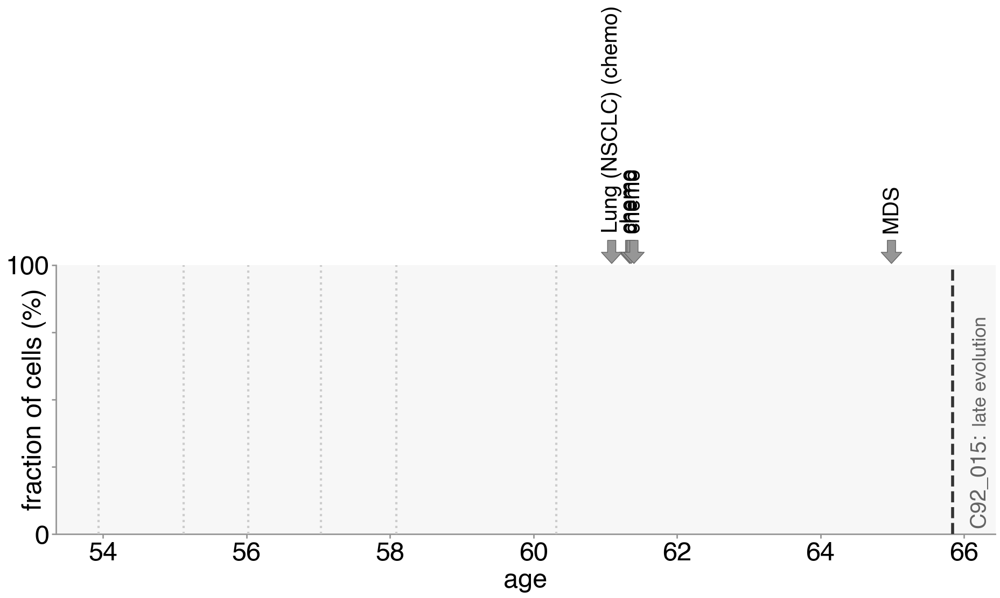

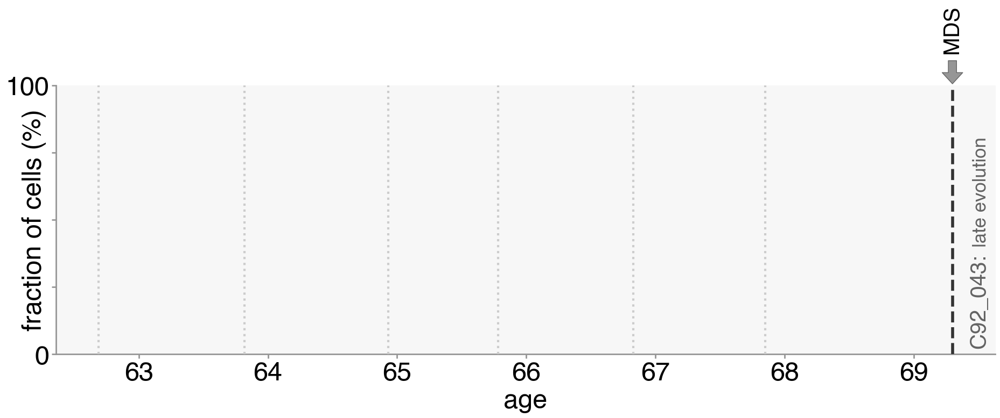

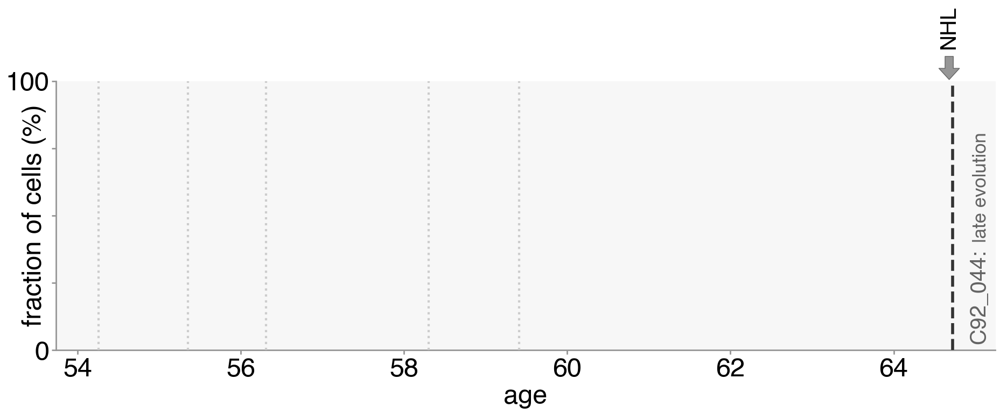

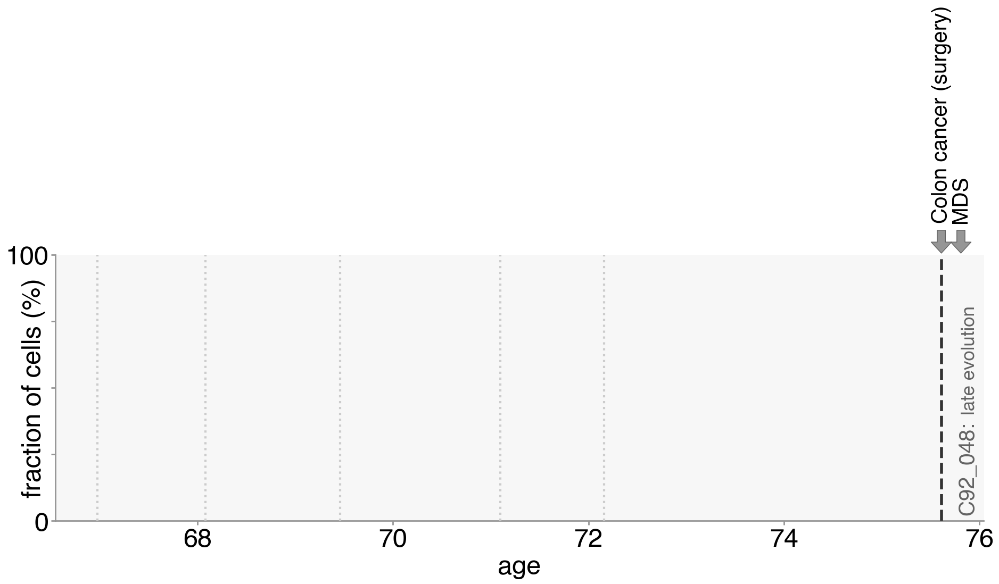

In [28]:
for sample_name in ['C92_015', 'C92_043', 'C92_044', 'C92_048']:
    ages_list = sample_ages_sorted[sample_name]
    diagnosis_age = sample_diagnosis_age[sample_name]
    Muller_plot_v3_muller_colours_no_variants(ages_list, sample_name, diagnosis_age, other_history)

## Cases that need midline shift of trajectory

In [29]:
cases_midline_shift = {
    'C92_002': [0, -15, -25, 0, 0, 0],
    # 'C92_003': [0, -28, 37, -37, -12, 0, 0],
    'C92_003': [0, -20, 0, 0, 0, 0, 0],
    'C92_007': [0, -17, -27.5, 0, 0],
    'C92_009': [0, -10, -15, 0, 0, 0],
    'C92_012': [0, -10, -20, 0, 0, 0, 0],
    'C92_016': [0, 10, 17.5, 0, 0, 0, 0],
    'C92_022': [0,  # stem cells
                                          0,  # blue TET2
                                          -10,  # green TET2
                                          -20,  # yellow SRSF2
                                          -15,  # pink 19p 
                                          -3,  # red KRAS
                                          5,  # red CBL
                                          0,  # pink JAK2
                                          0,  # pink MPL
                                          -3], # purple 9p
    'C92_023': [0, 0, 0, -25, -30, -30, -30, -30, -20, 0],
    'C92_036': [0, -10, -15],
    'C92_042': [0, -14, -30, 0, 0, 0, 0, 0],
    'C92_056': [0, 0, -10, -20, -10, 0, 0, 0],
    'C92_066': [0, 5, -5, 0, 0],
    'C92_061': [0, -24, -48, -20, 0],
    'C92_068': [0, -15, -30, 0, 0],
    'C92_086': [0, -7.5, -10, 0, 0]    
}

# ['C92_034', 'C92_062','CNTRL_185', 'C92_054'] (don't need midline shift)

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


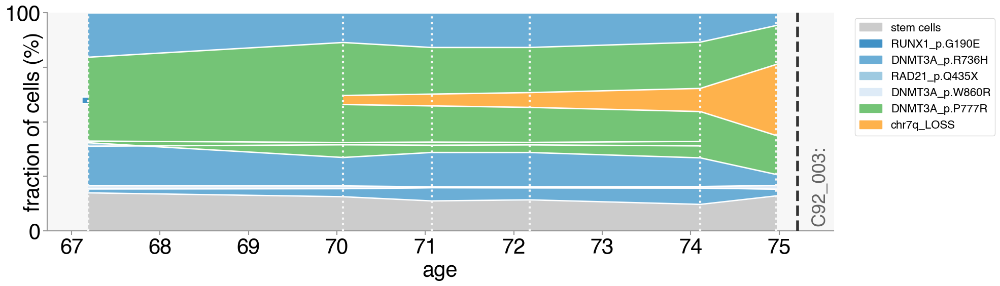

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


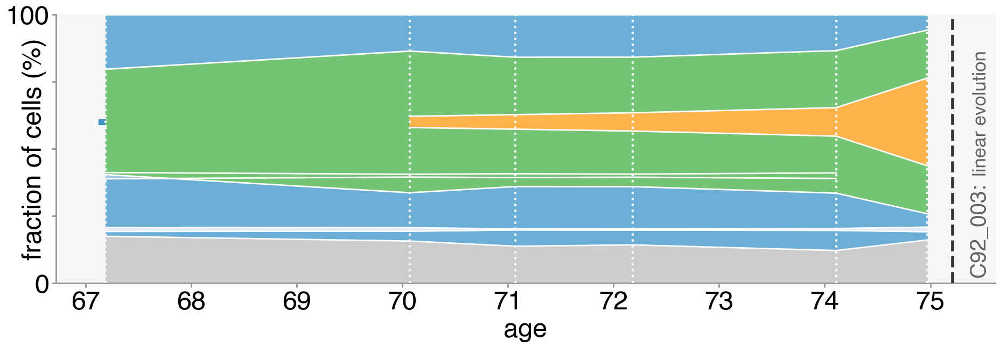

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


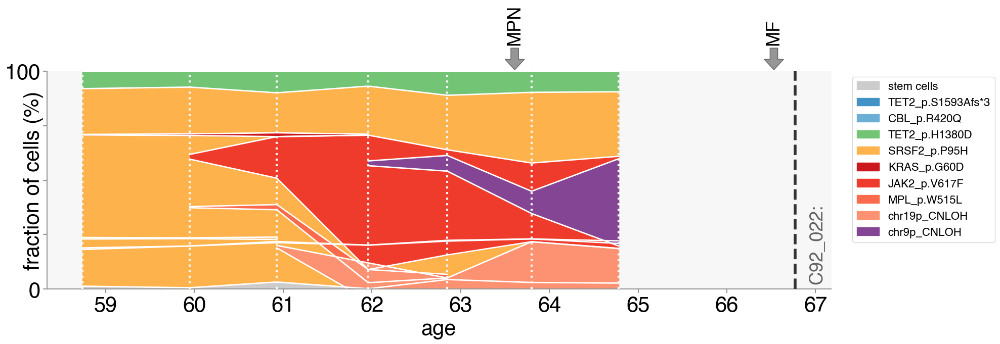

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


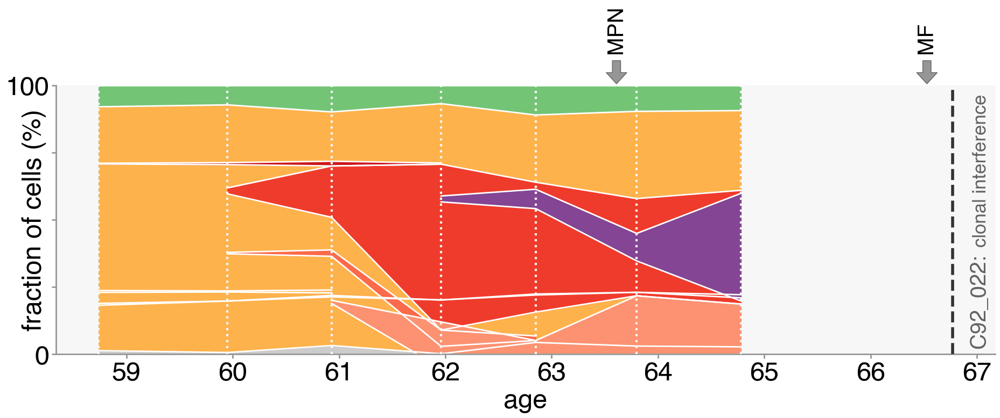

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


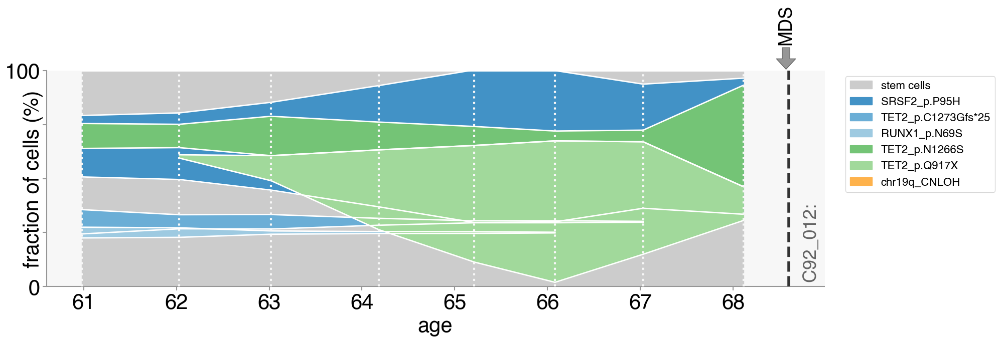

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


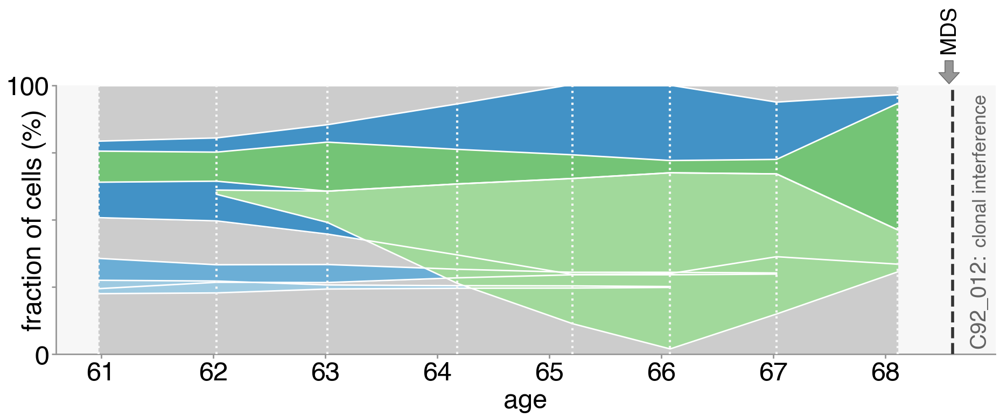

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


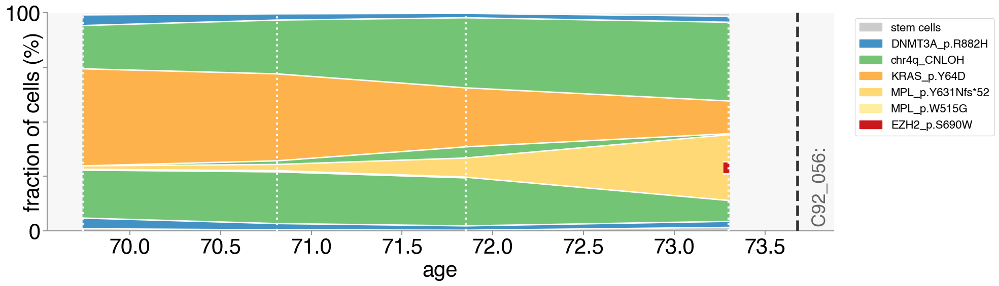

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


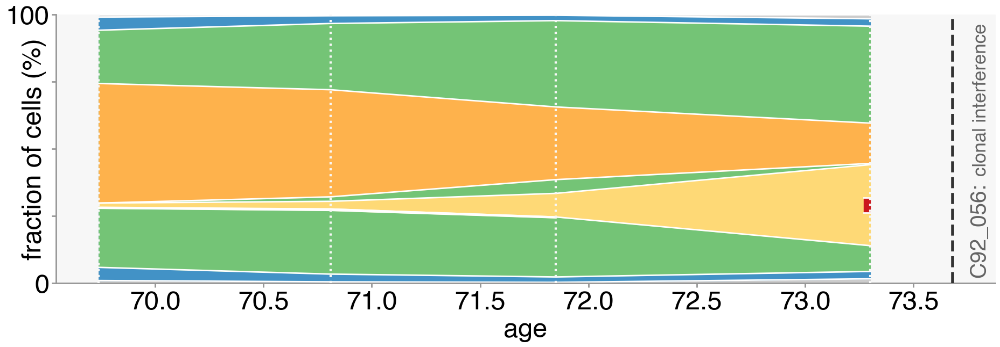

In [30]:
#Cases which need midline adjustment
cases_without_variants = []

# for sample_name in cases_midline_shift.keys():
for sample_name in ['C92_003', 'C92_022', 'C92_012', 'C92_056']:
    if sample_name not in ['C92_023']:
        try:
            ages_list = sample_ages_sorted[sample_name]
            diagnosis_age = sample_diagnosis_age[sample_name]
            phylogeny = retrieve_phylogeny(sample_name)
            phylogeny = add_midline_shift(phylogeny, cases_midline_shift[sample_name])
            phylogeny = assign_clone_colours(phylogeny)
            timepoints = cell_fraction_timepoints(phylogeny, ages_list)
            Muller_plot_v3_muller_colours(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
            Muller_plot_v3_muller_colours_no_legend(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
        except FileNotFoundError:
            cases_without_variants.append(sample_name)

### C92_034

- Keep the colours the same as on the trajectory plot

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


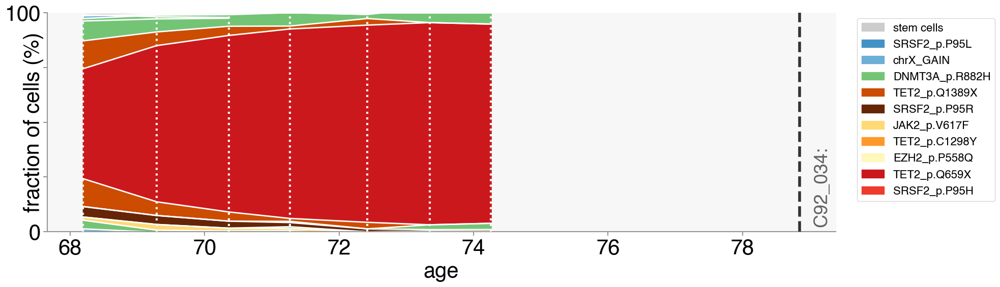

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


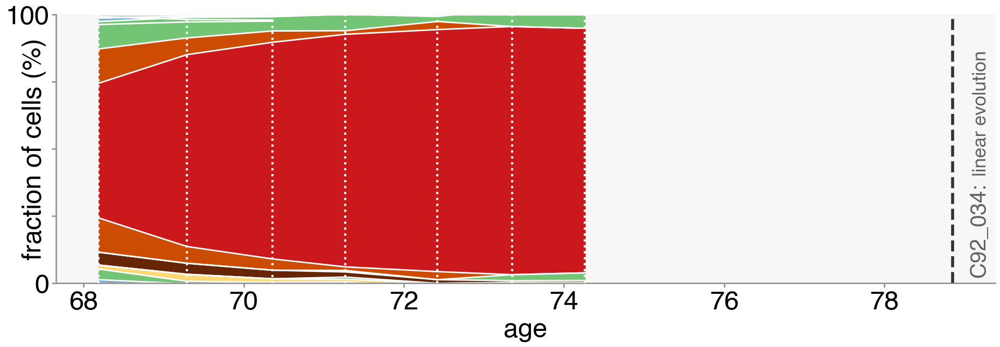

In [31]:
sample_name = 'C92_034'
ages_list = sample_ages_sorted[sample_name]
diagnosis_age = sample_diagnosis_age[sample_name]
phylogeny = retrieve_phylogeny(sample_name)
phylogeny = add_midline_shift(phylogeny, [0, 31, 16, 0, 0, 0, 0, 0, 0, 0, 0])
phylogeny = assign_clone_colours(phylogeny, keep_counts={3})
timepoints = cell_fraction_timepoints(phylogeny, ages_list)
Muller_plot_v3_muller_colours(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
Muller_plot_v3_muller_colours_no_legend(timepoints, phylogeny, sample_name, diagnosis_age, other_history)

### C92_023

- Keep the colours the same as on the trajectory plot

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


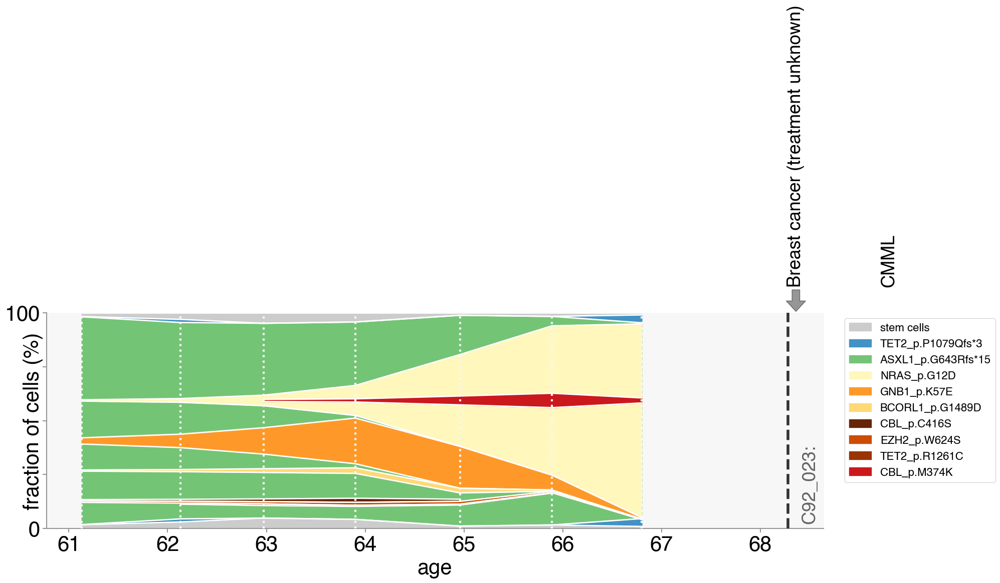

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


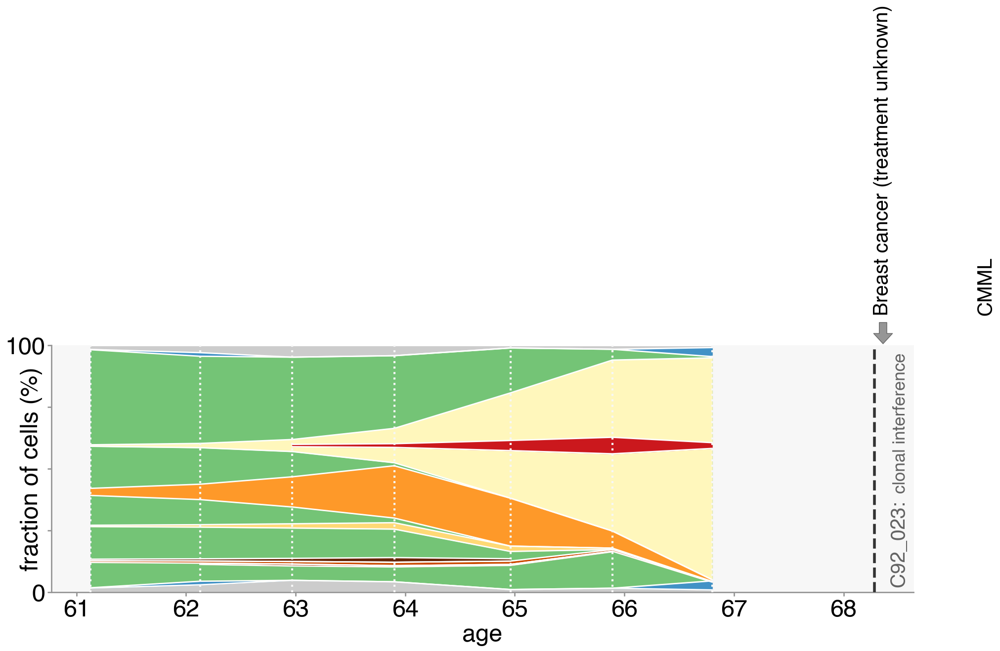

In [32]:
sample_name = 'C92_023'
ages_list = sample_ages_sorted[sample_name]
diagnosis_age = sample_diagnosis_age[sample_name]
phylogeny = retrieve_phylogeny(sample_name)
phylogeny = add_midline_shift(phylogeny, [0, 0, 0, -25, -30, -30, -30, -30, -20, 0])
phylogeny = assign_clone_colours(phylogeny, keep_counts={3})
timepoints = cell_fraction_timepoints(phylogeny, ages_list)
Muller_plot_v3_muller_colours(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
Muller_plot_v3_muller_colours_no_legend(timepoints, phylogeny, sample_name, diagnosis_age, other_history)

## Cases that do not need midline shift of trajectory

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


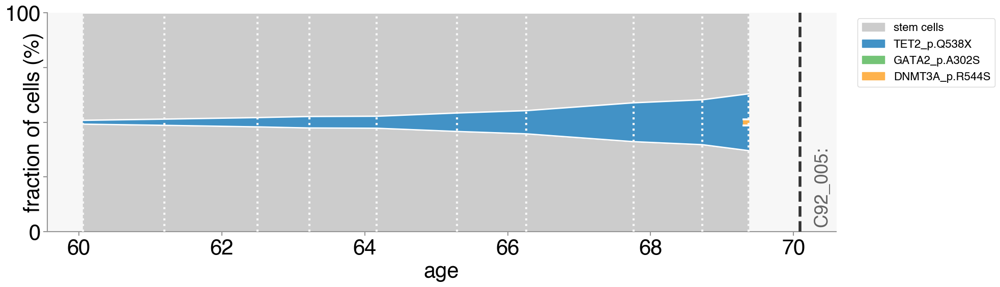

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


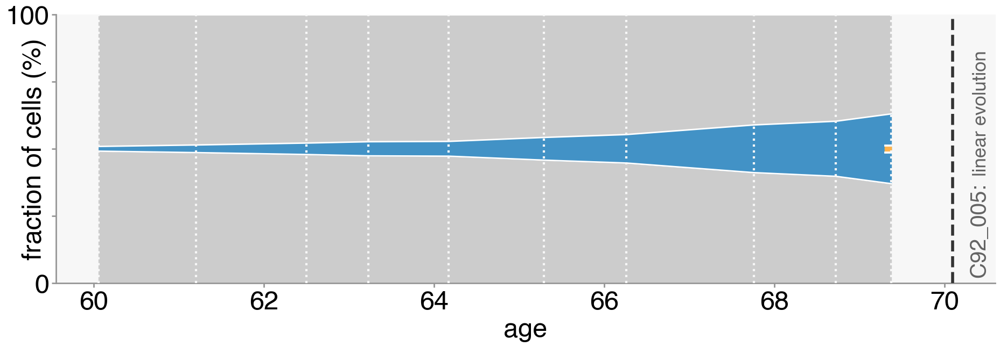

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


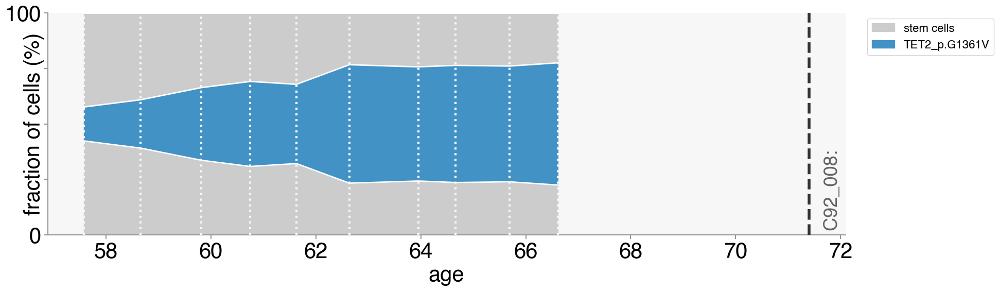

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


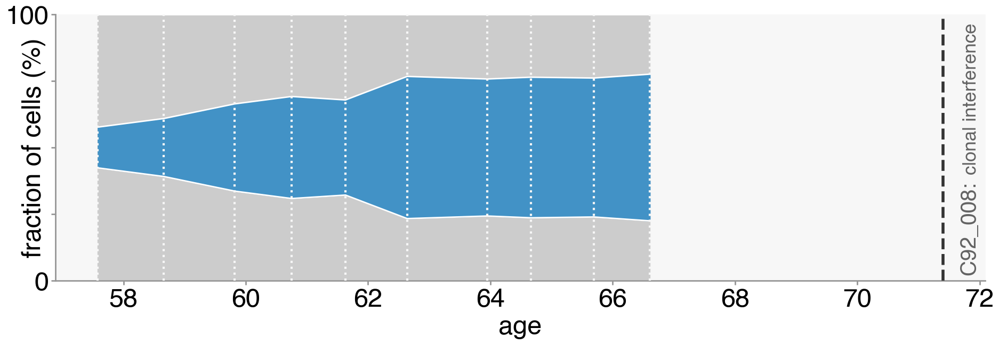

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


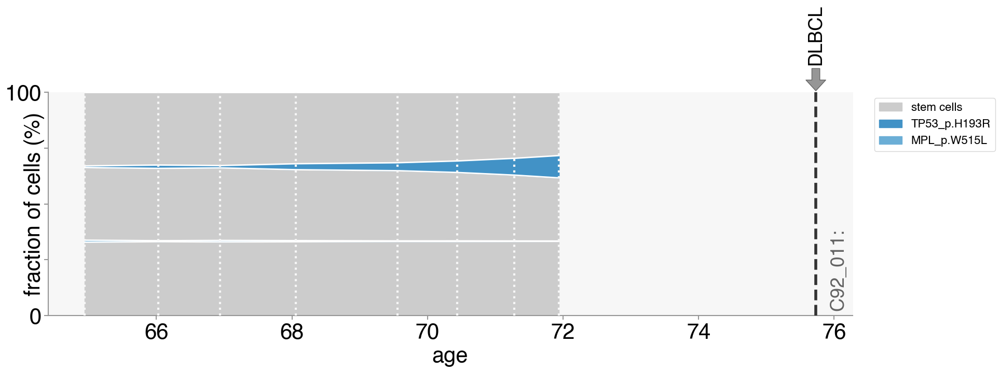

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


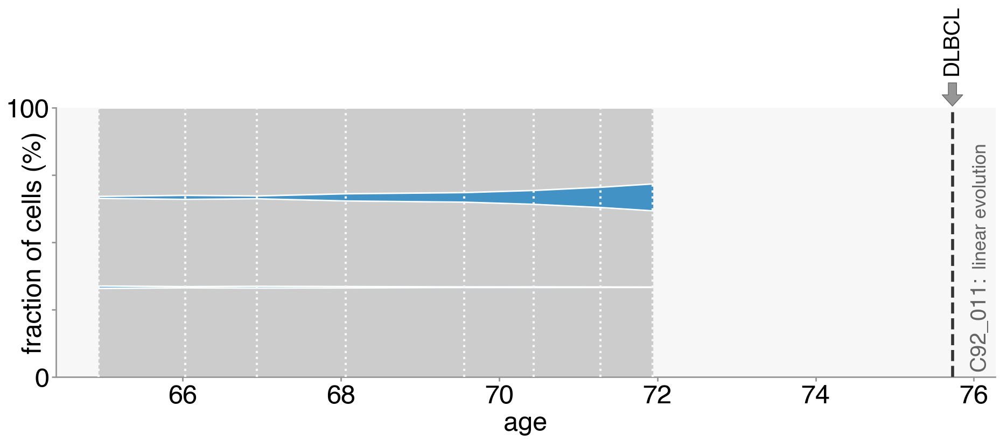

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


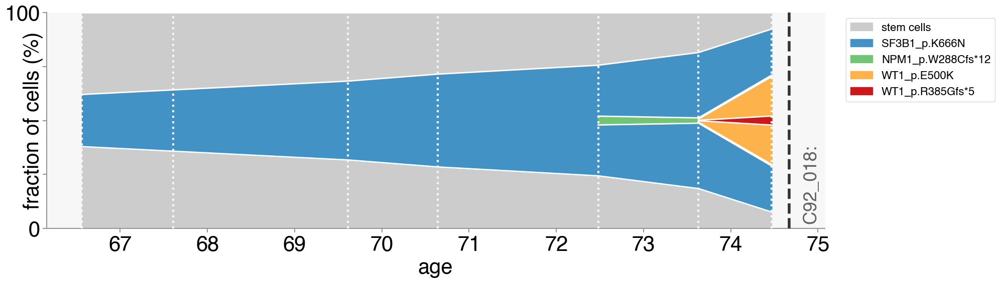

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


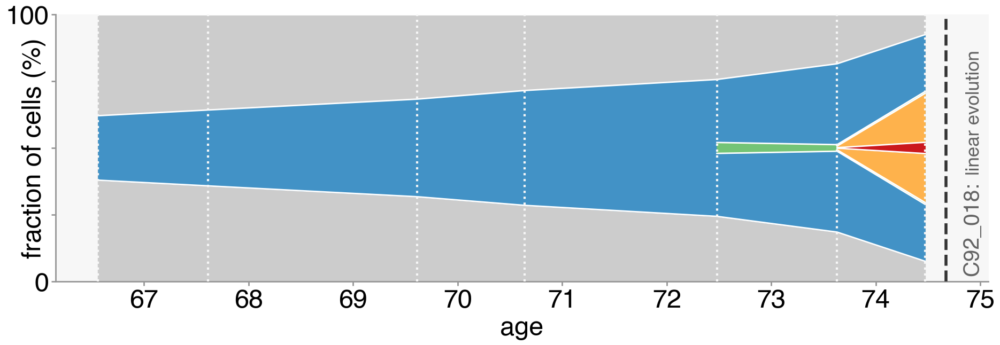

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


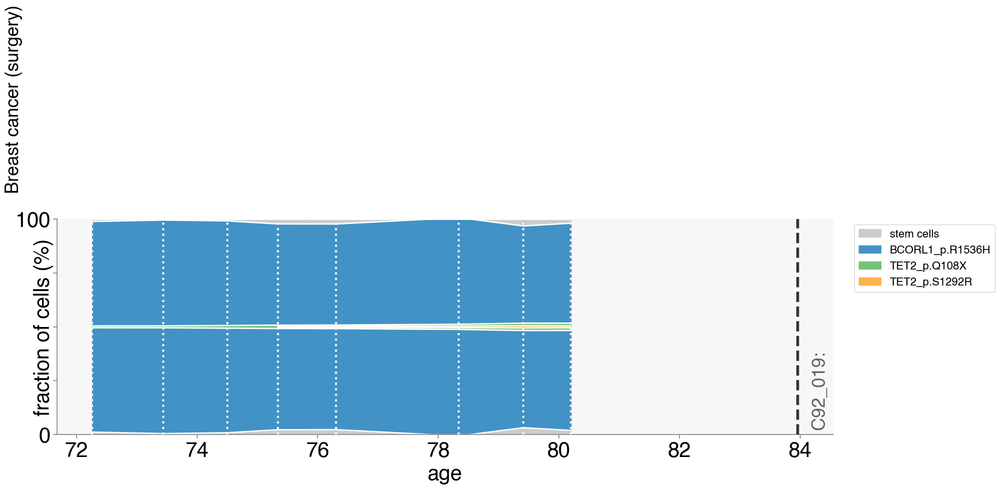

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


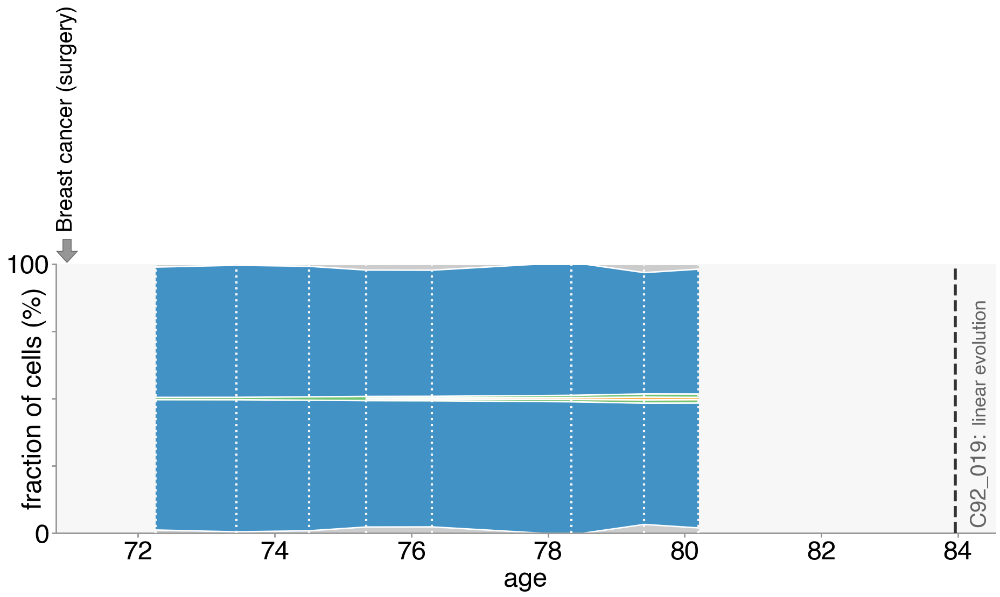

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


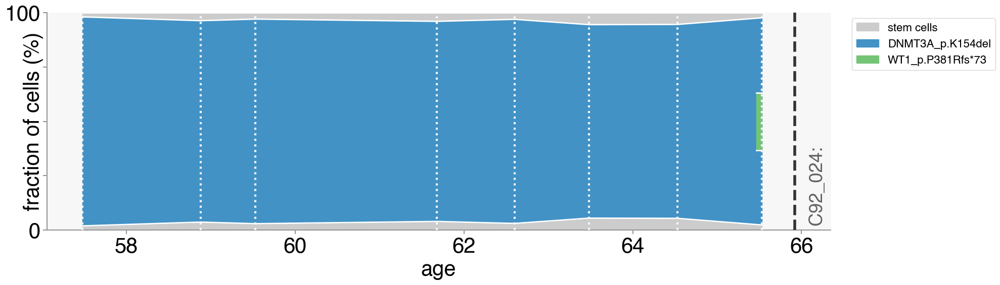

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


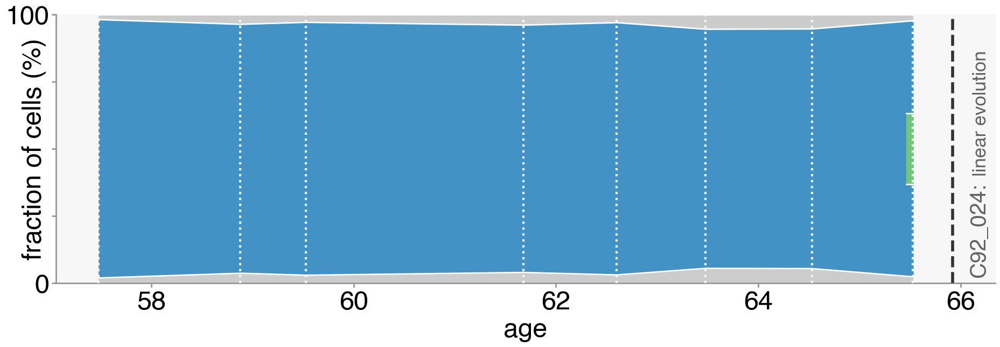

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


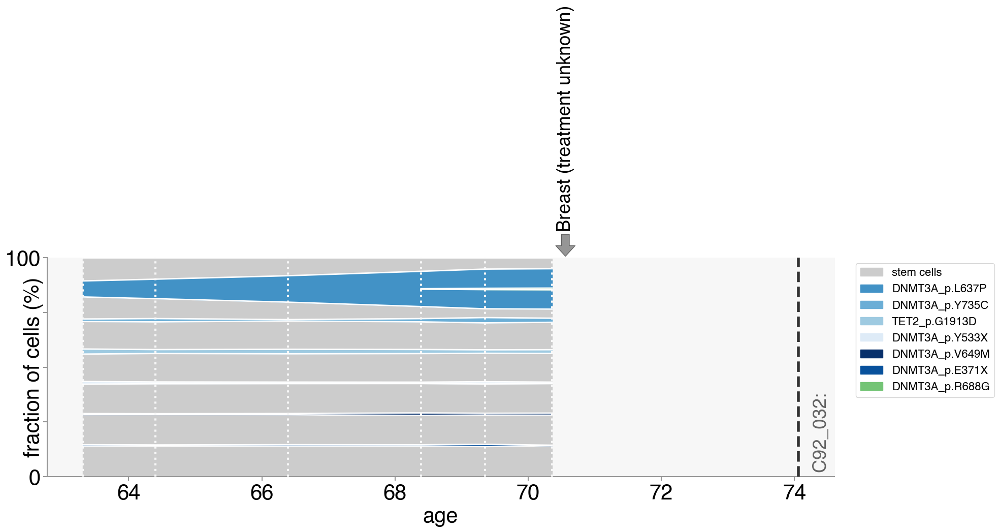

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


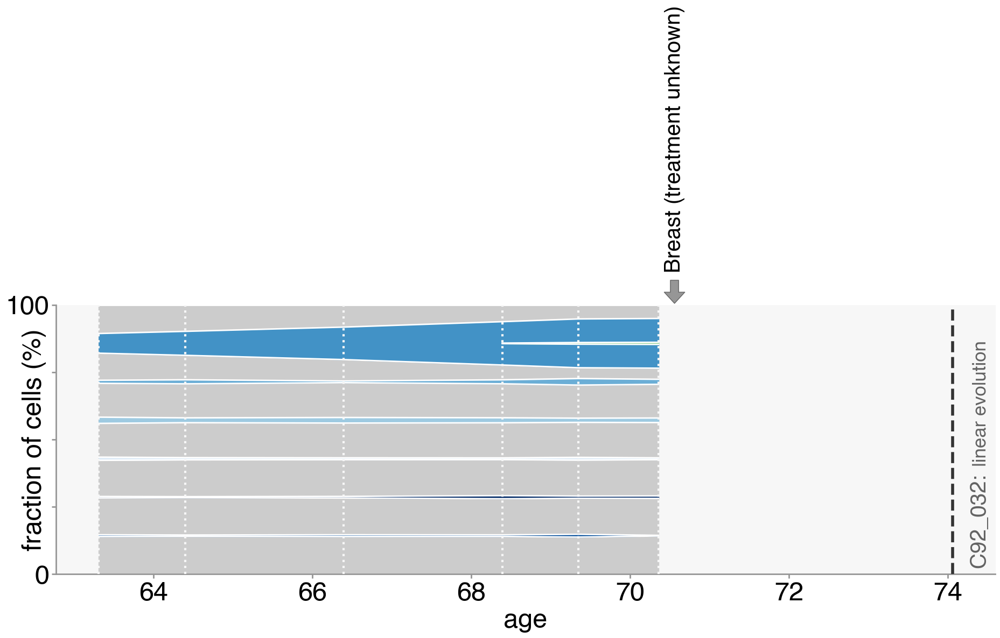

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


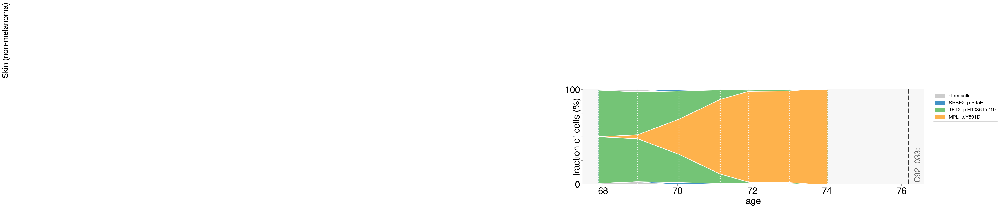

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


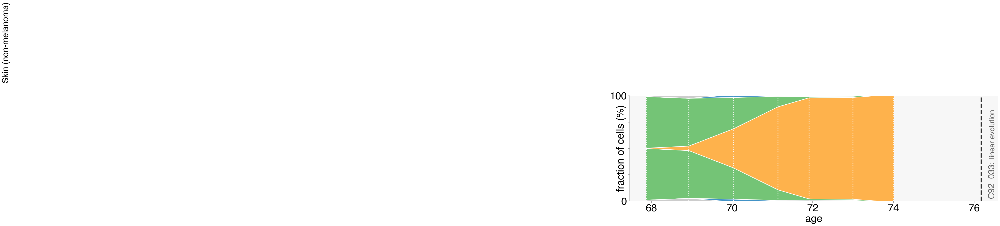

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


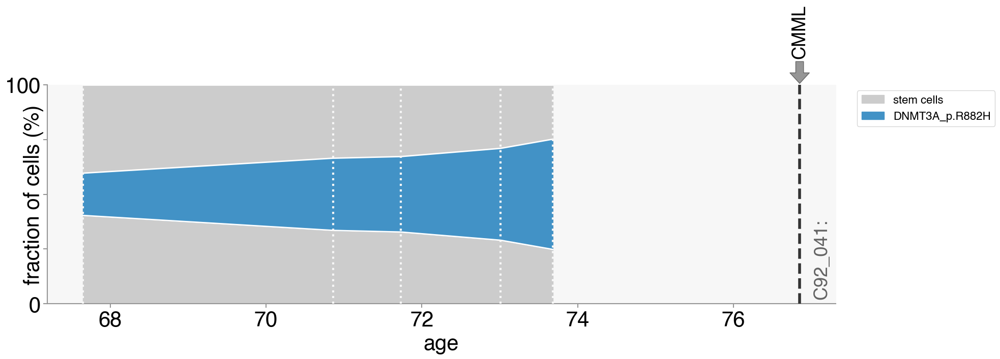

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


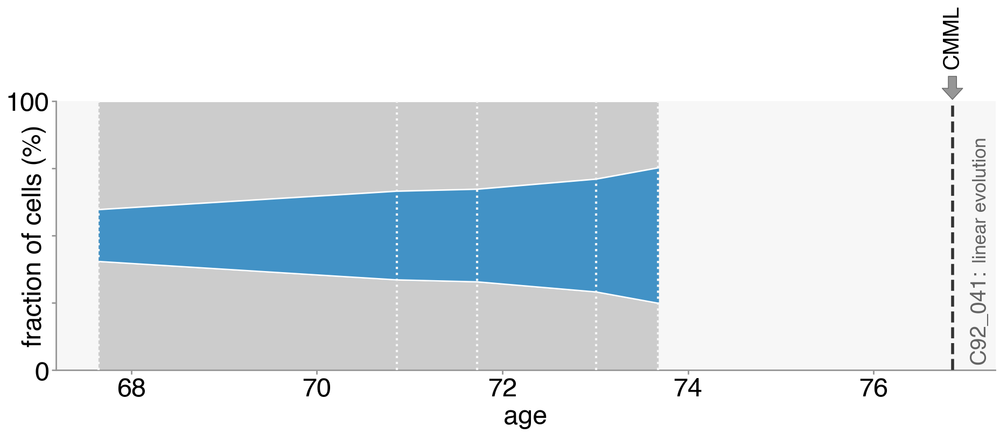

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


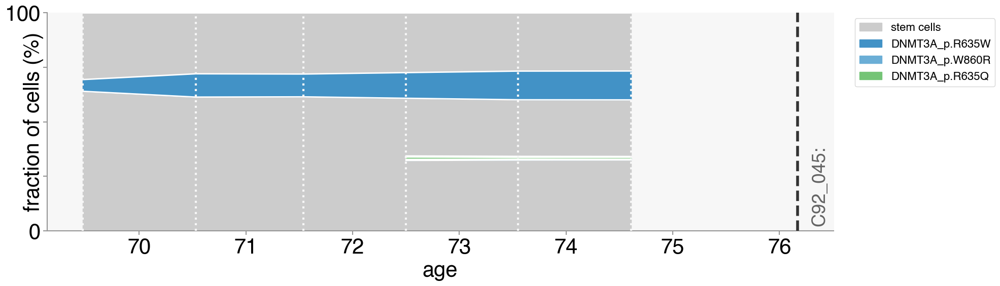

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


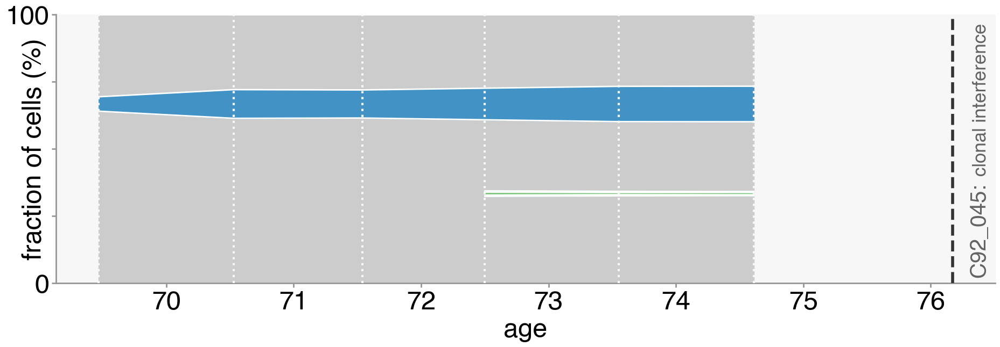

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


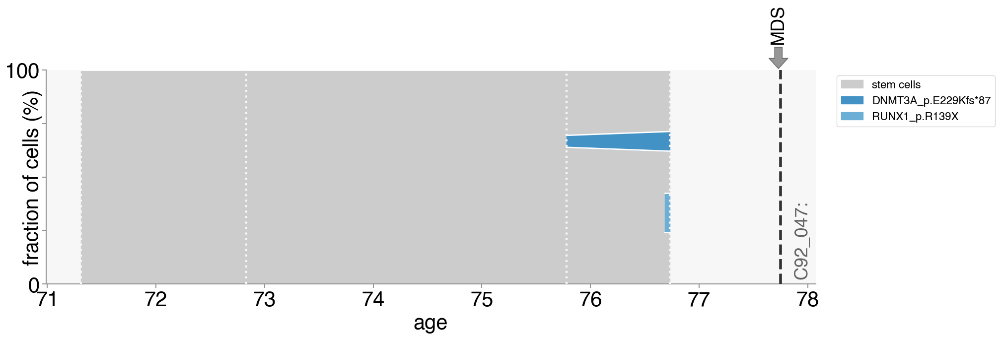

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


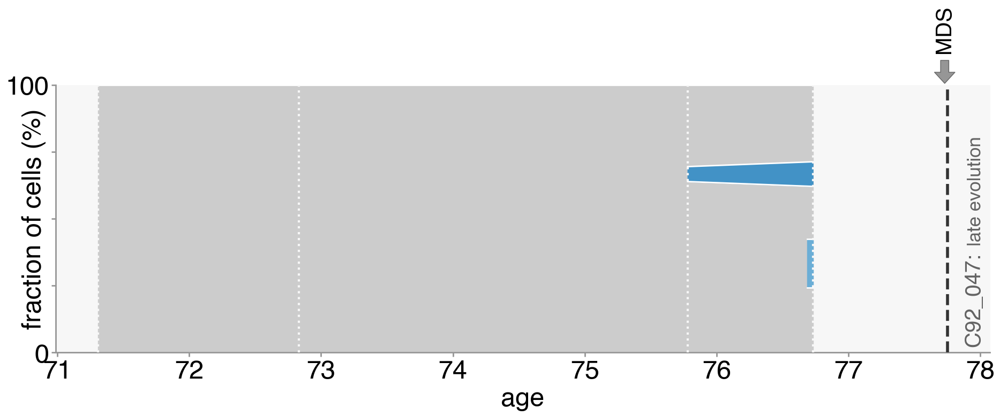

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


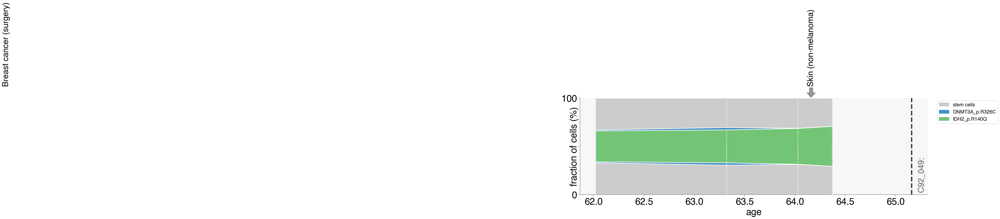

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


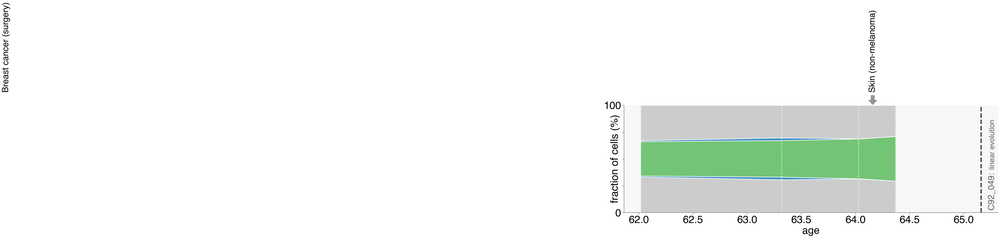

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


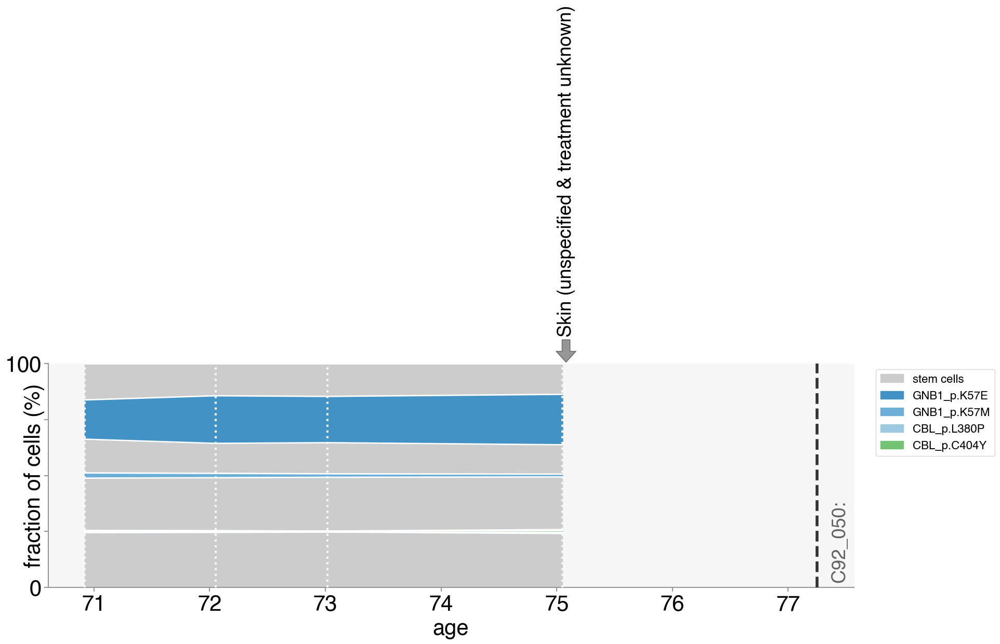

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


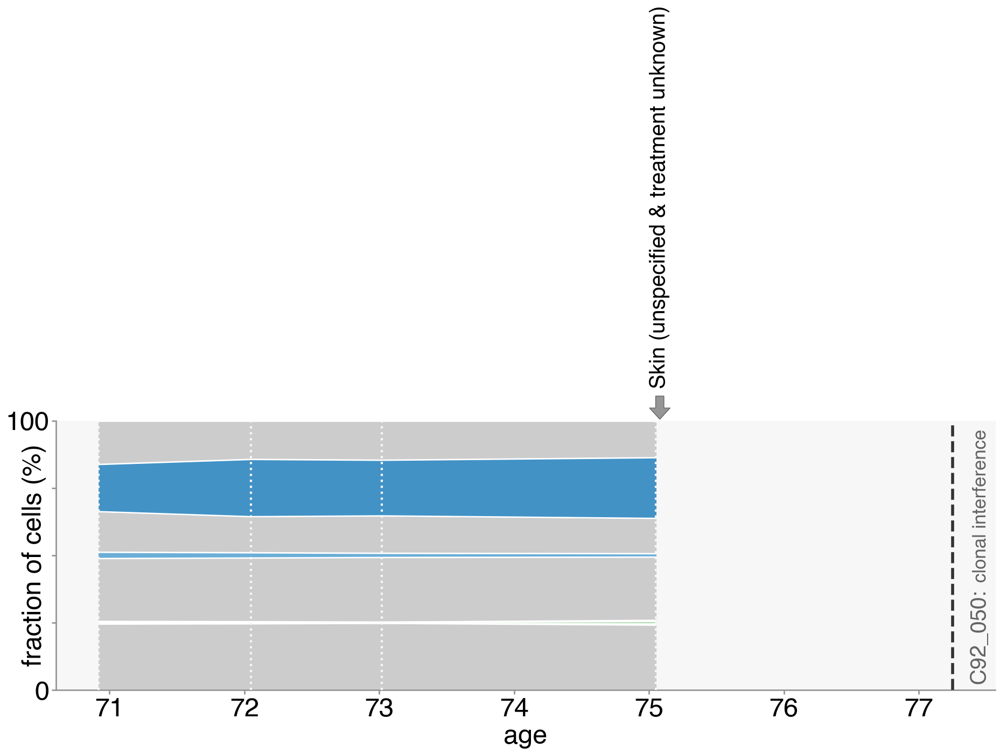

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


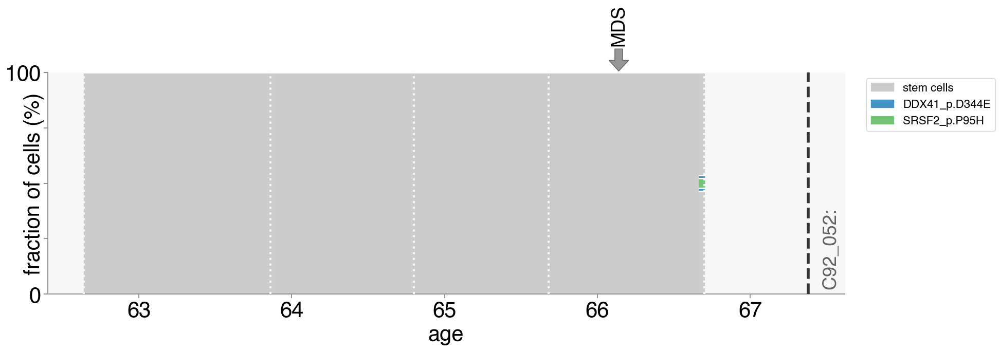

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


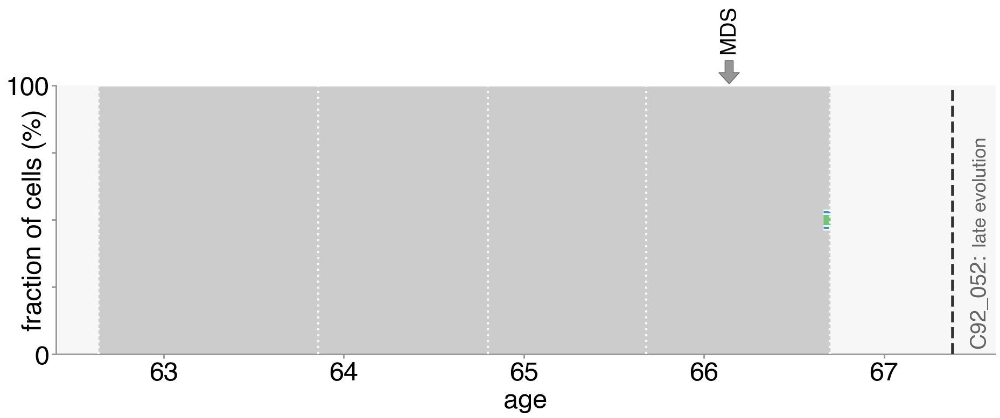

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


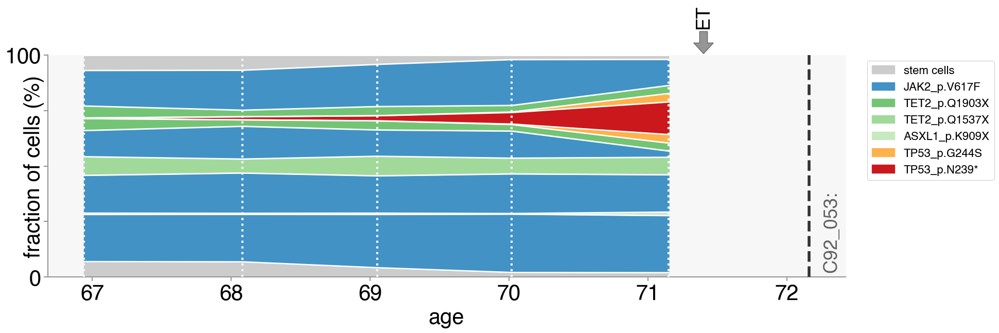

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


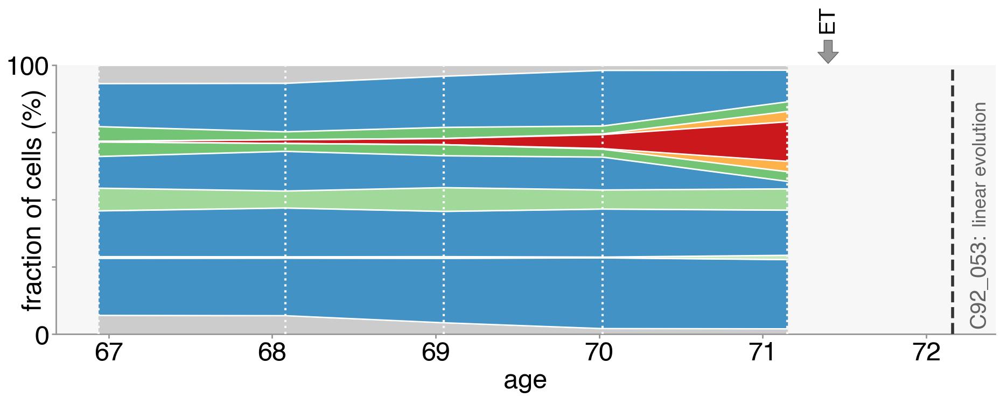

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


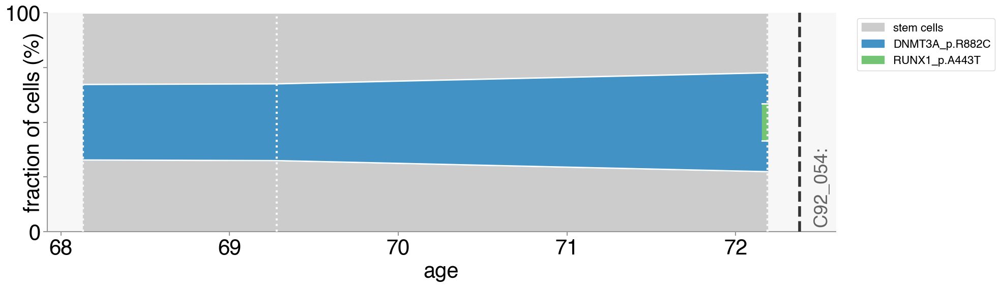

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


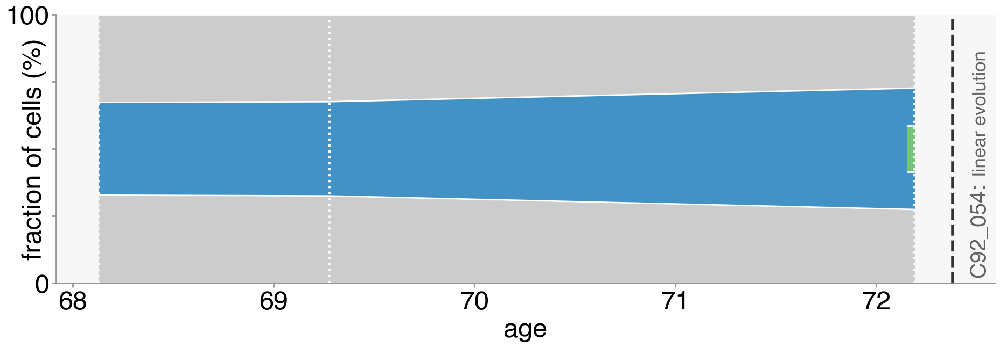

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


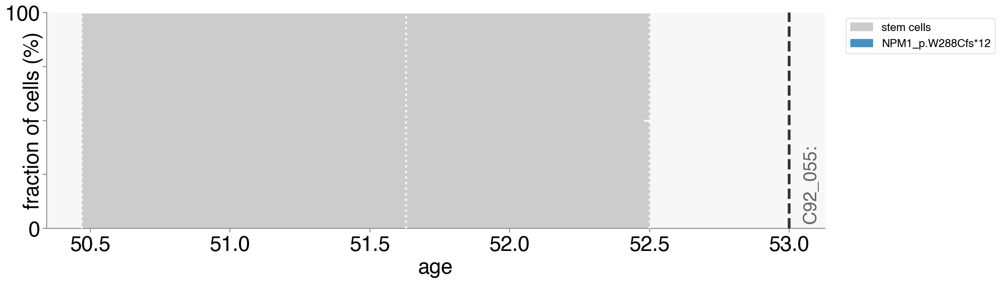

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


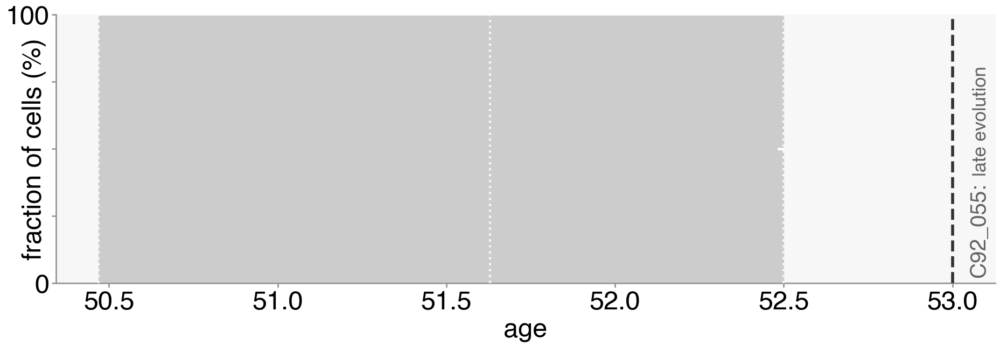

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


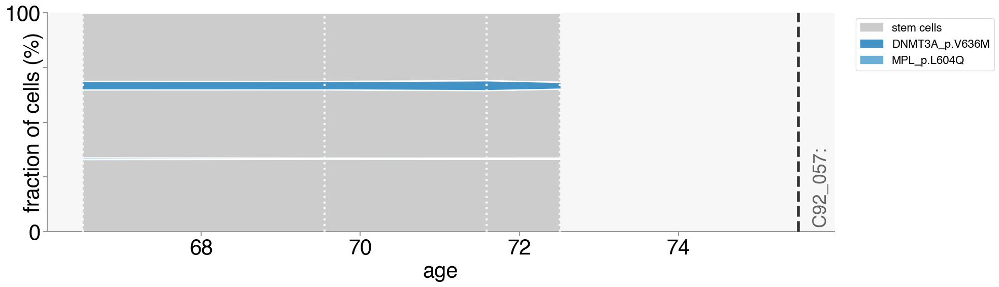

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


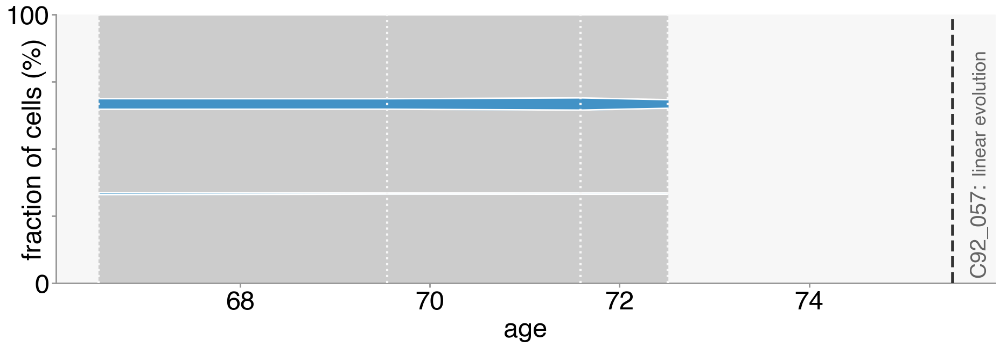

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


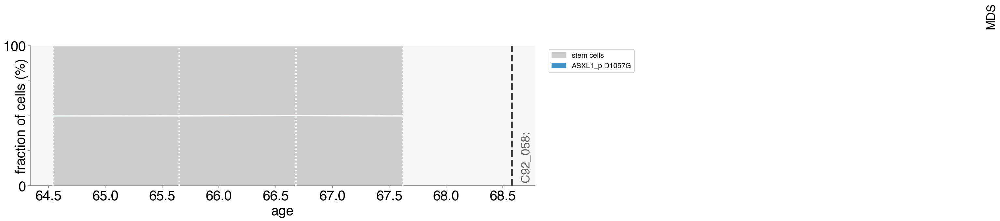

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


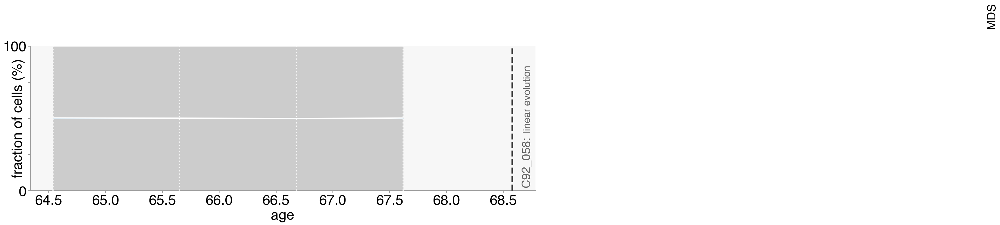

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


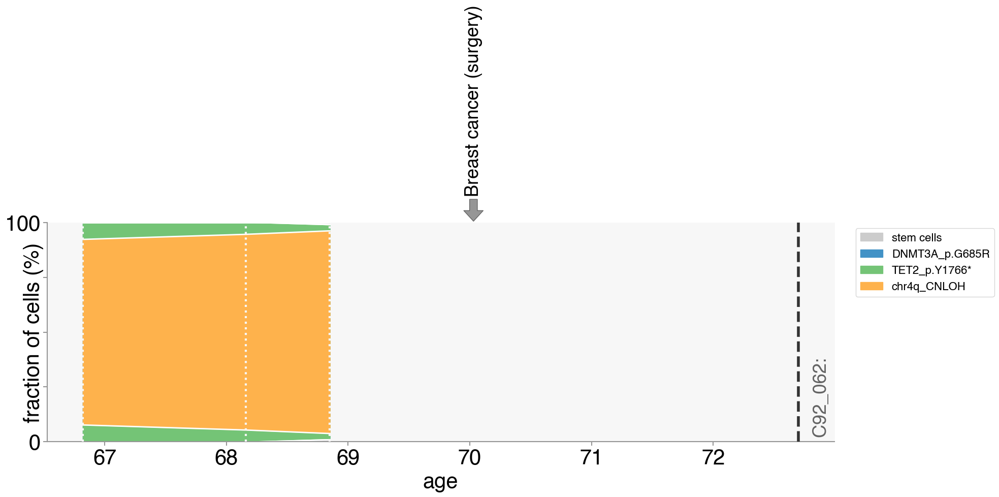

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


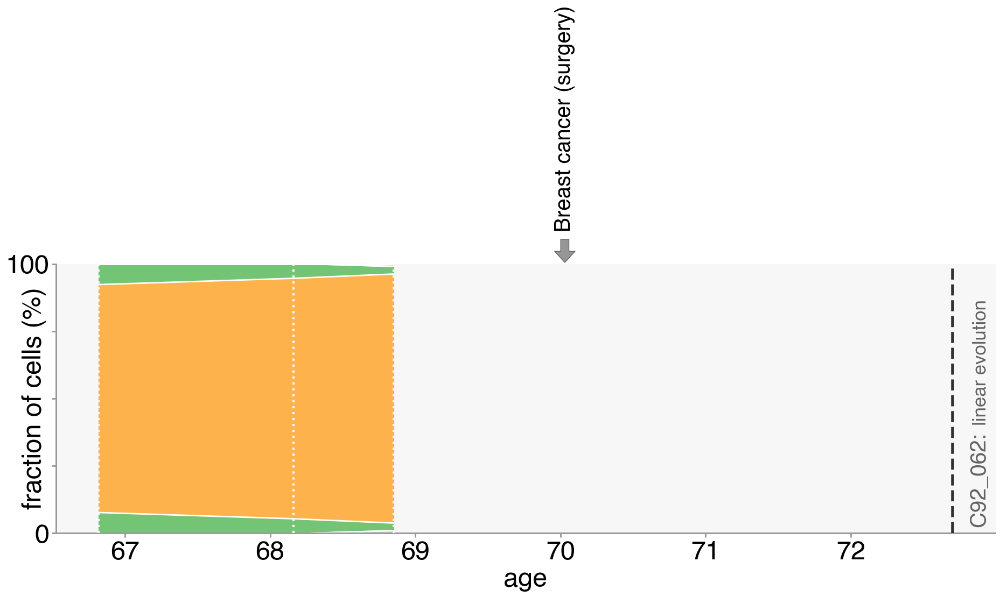

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


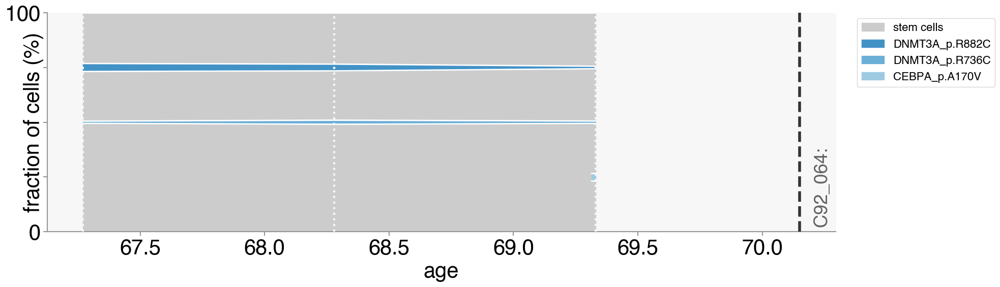

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


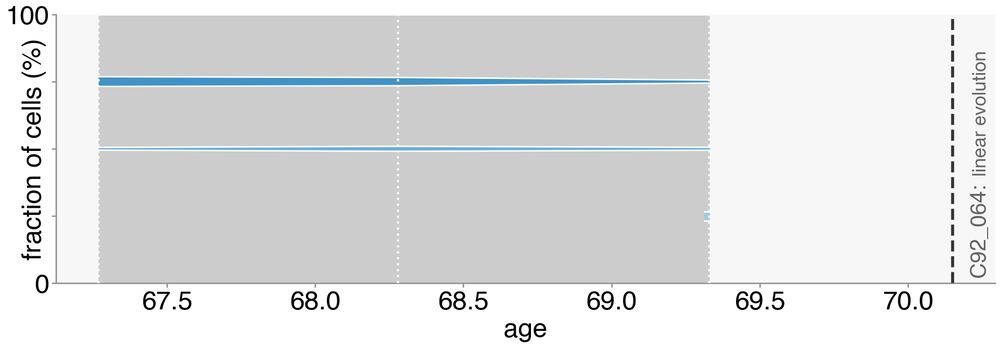

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


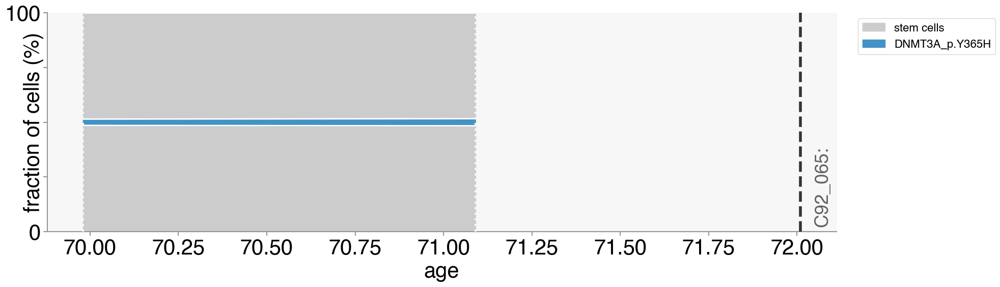

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


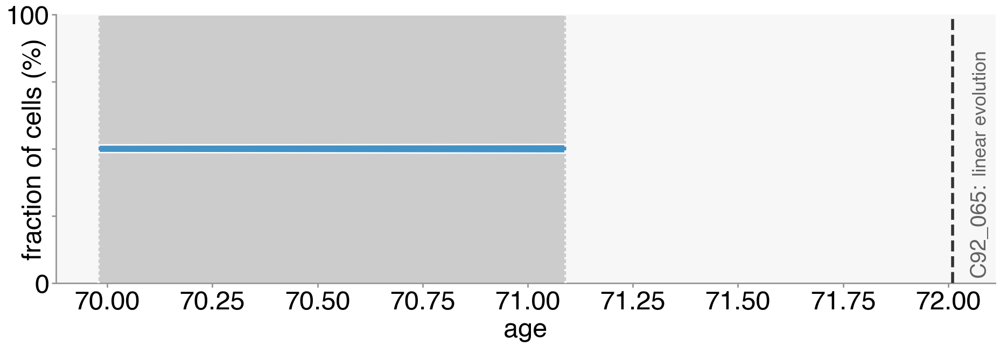

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


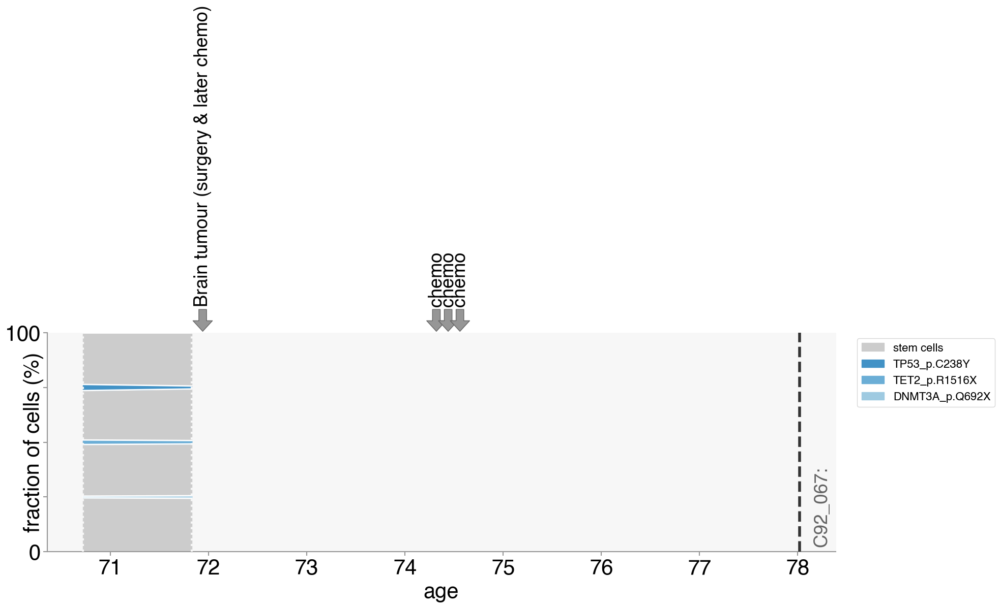

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


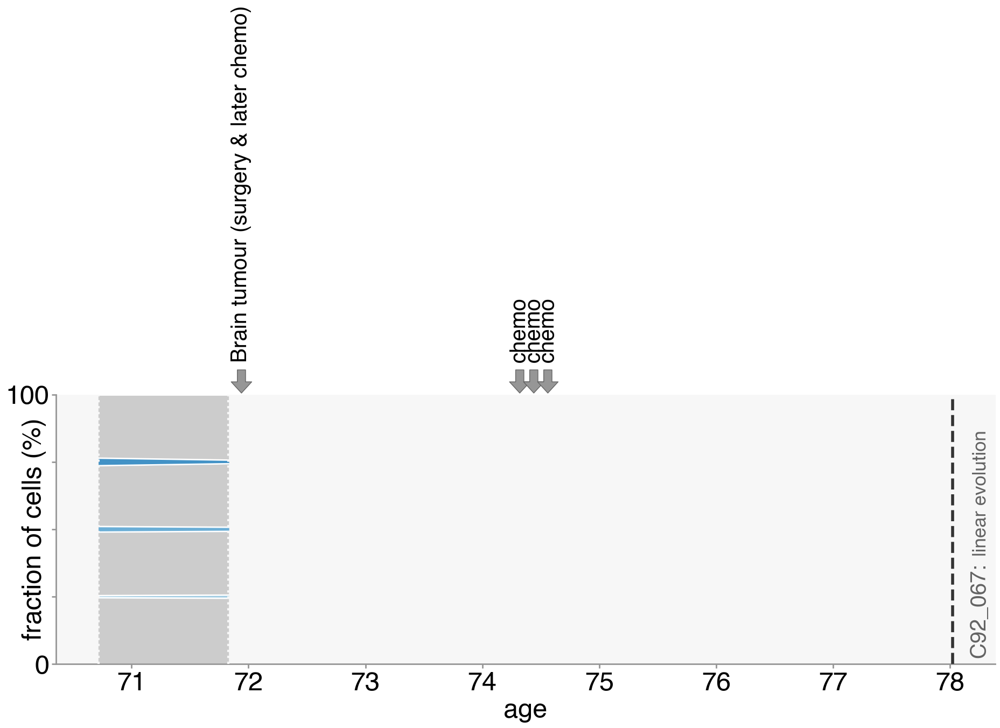

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


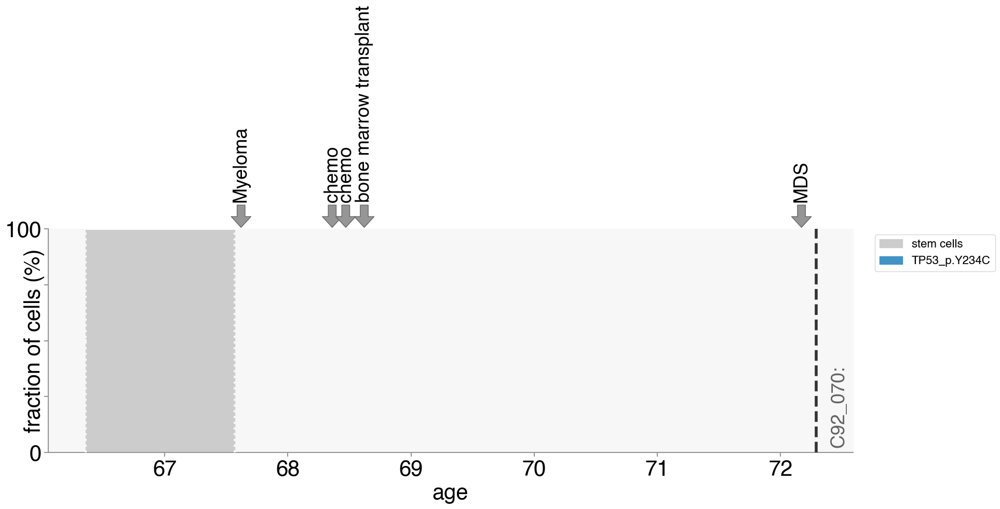

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


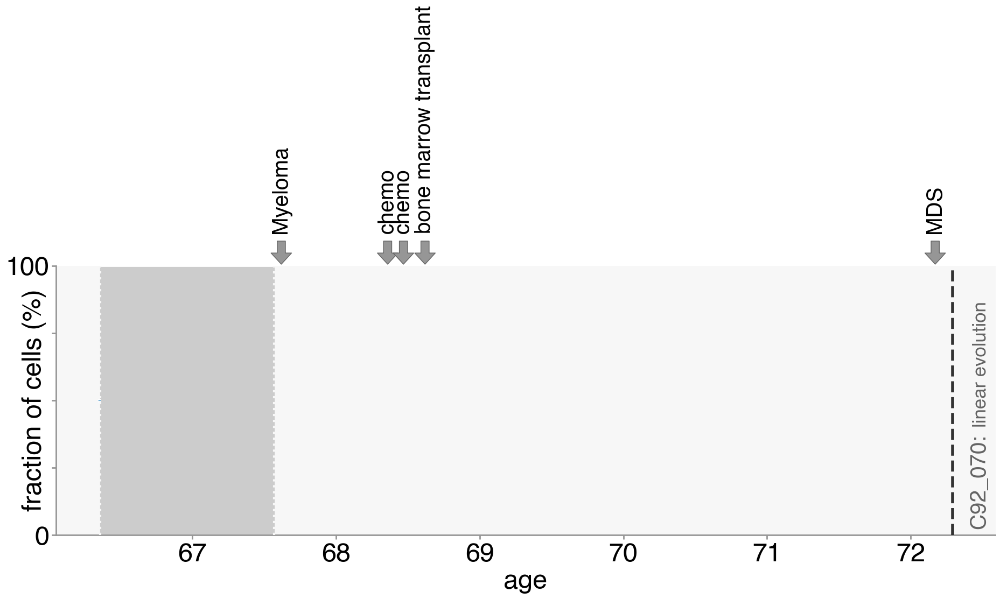

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


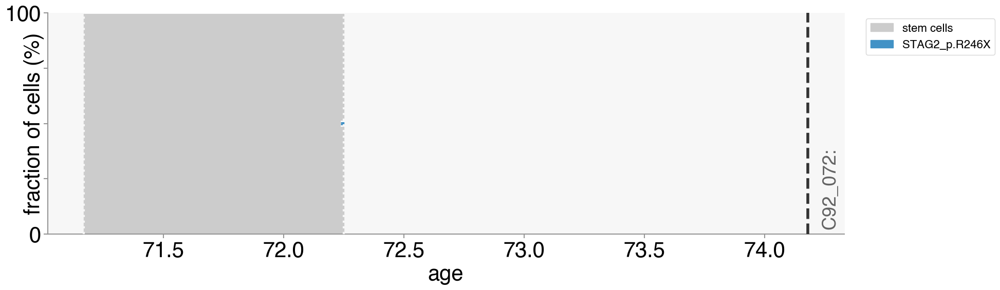

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


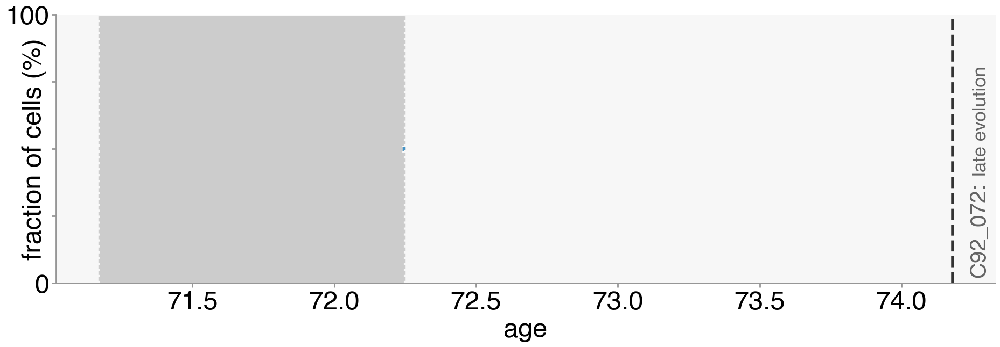

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


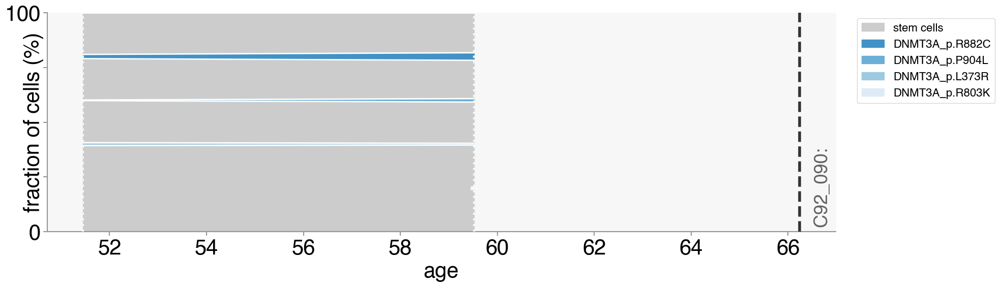

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


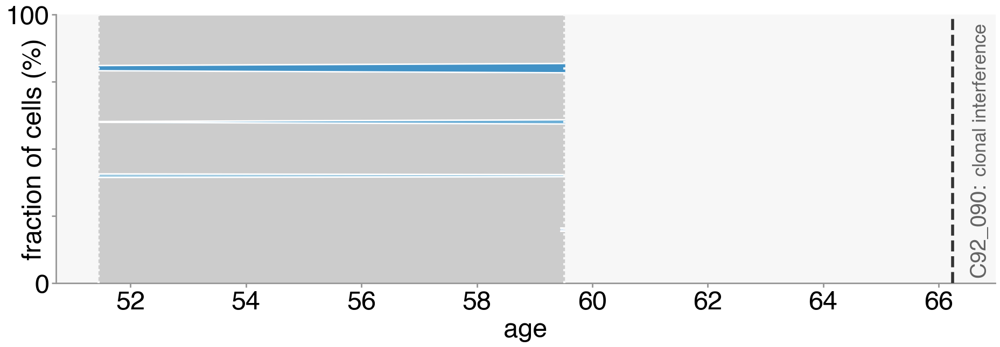

In [33]:
#Cases which don't need midline adjustment
cases_without_variants = []

for sample_name in cases:
# for sample_name in ['C92_034', 'C92_062','CNTRL_185', 'C92_054']:
    if sample_name not in cases_midline_shift.keys():
        if sample_name not in ['C92_034', 'C92_023']:
            try:
                ages_list = sample_ages_sorted[sample_name]
                diagnosis_age = sample_diagnosis_age[sample_name]
                phylogeny = retrieve_phylogeny(sample_name)
                phylogeny = add_midline_shift(phylogeny, [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
                phylogeny = assign_clone_colours(phylogeny)
                timepoints = cell_fraction_timepoints(phylogeny, ages_list)
                Muller_plot_v3_muller_colours(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
                Muller_plot_v3_muller_colours_no_legend(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
            except FileNotFoundError:
                cases_without_variants.append(sample_name)

# Controls Muller plots

## Controls that do not need midline shift of trajectory

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


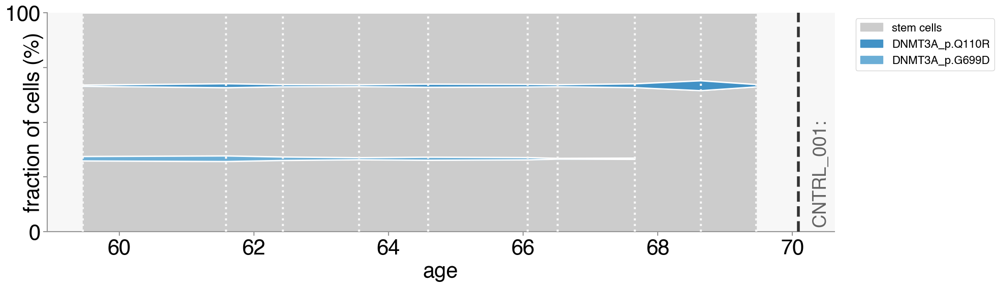

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


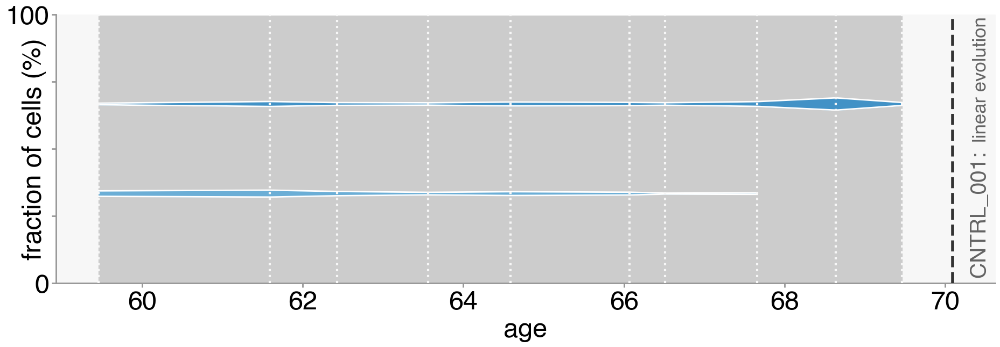

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


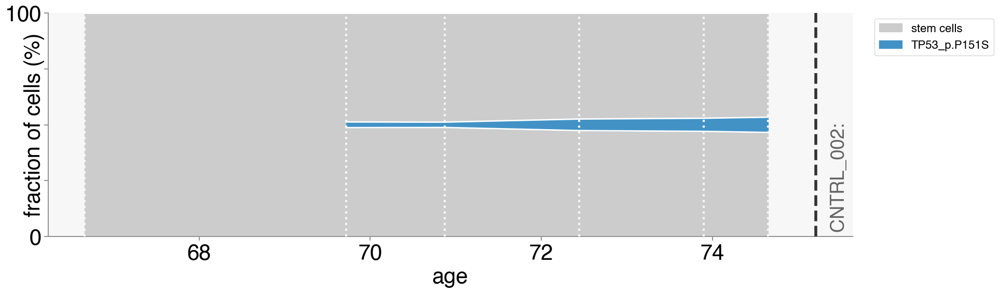

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


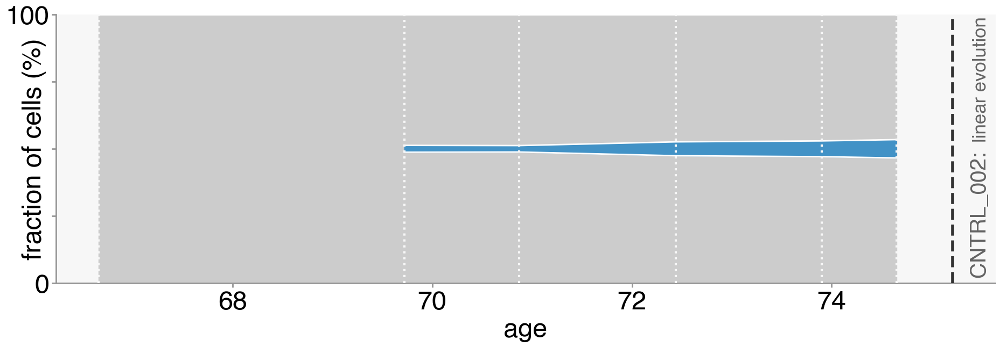

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


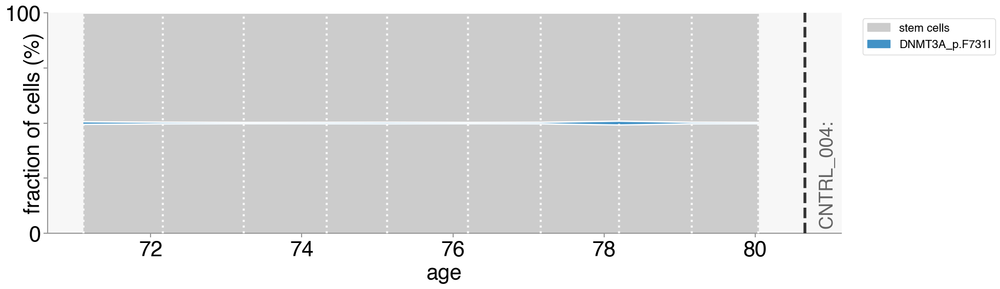

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


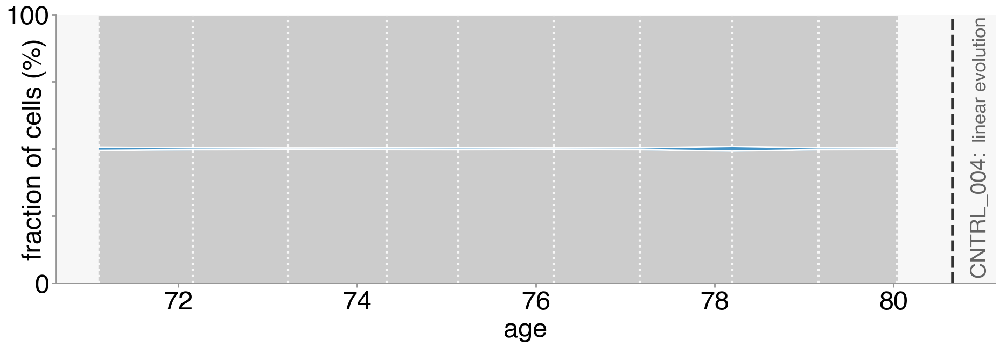

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


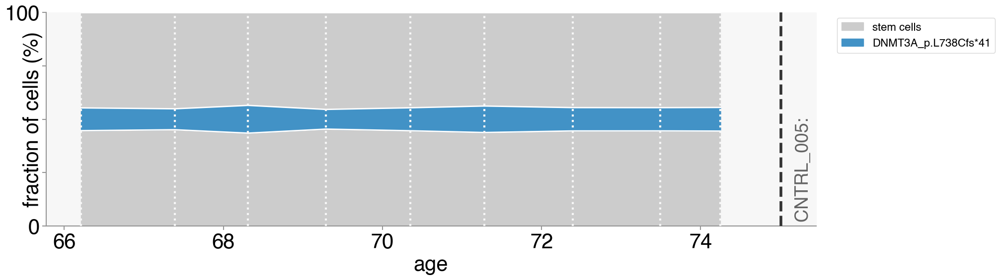

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


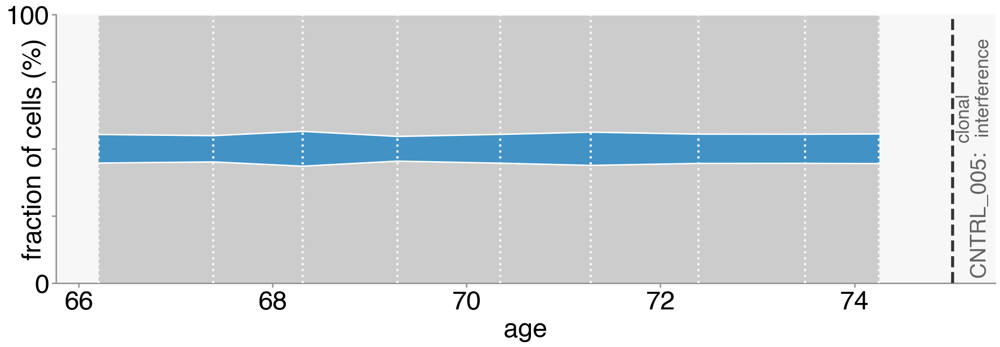

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


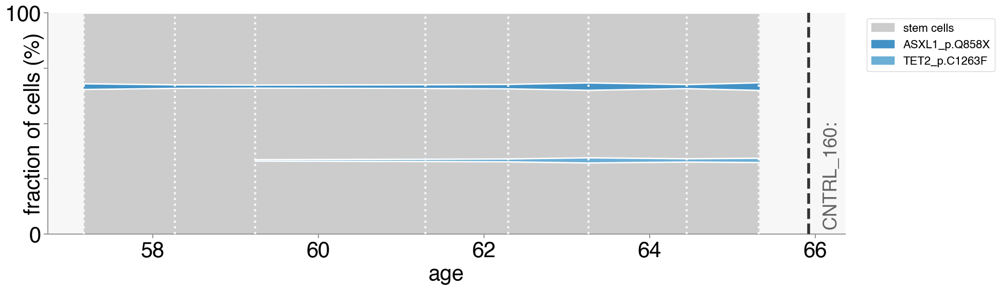

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


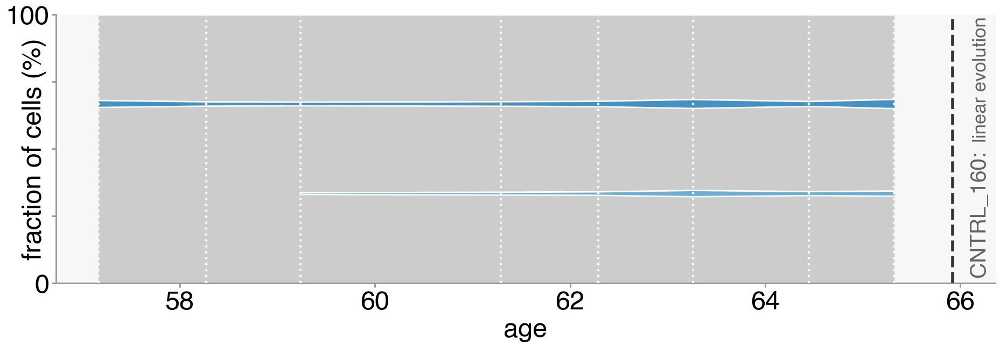

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


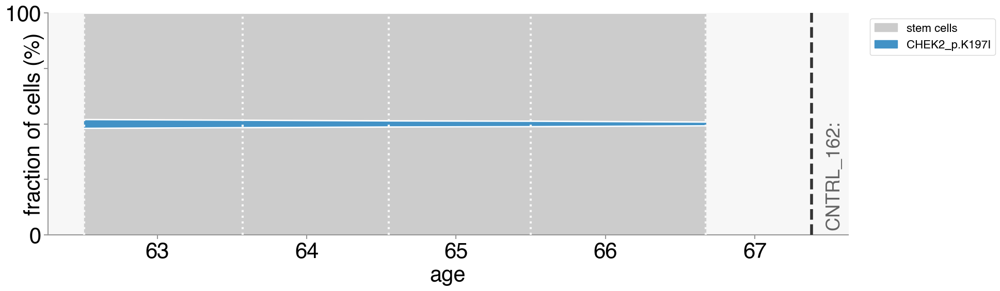

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


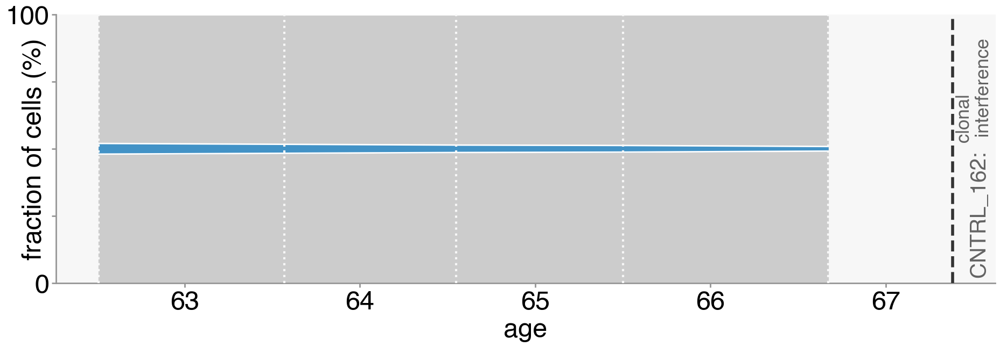

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


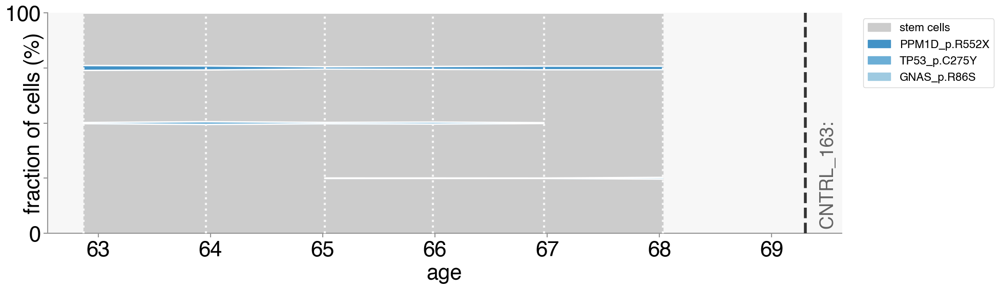

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


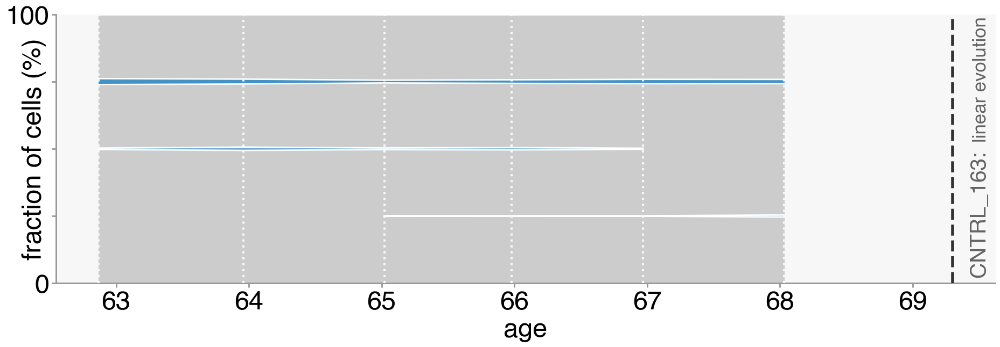

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


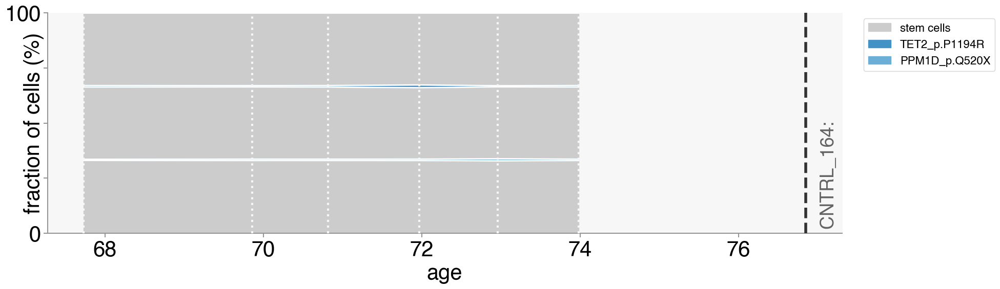

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


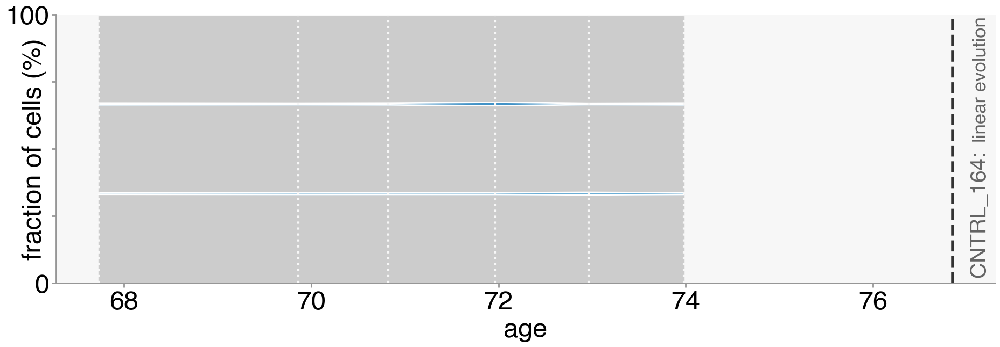

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


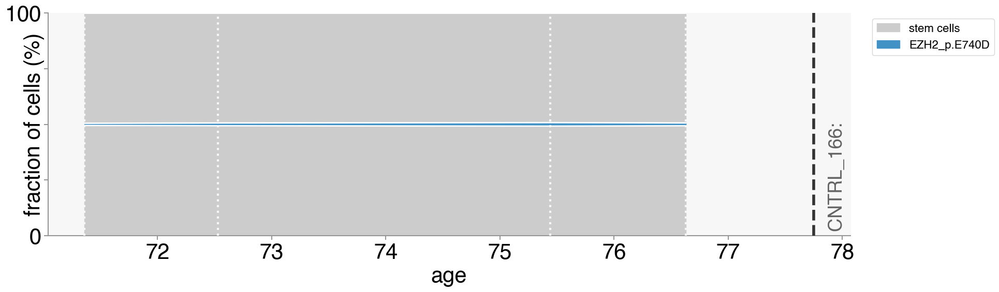

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


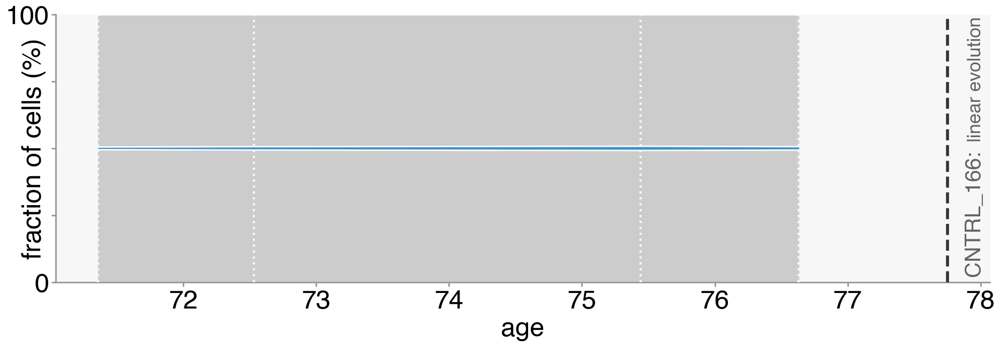

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


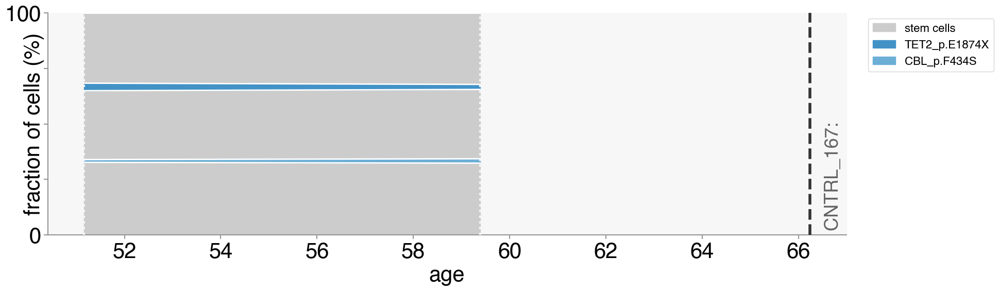

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


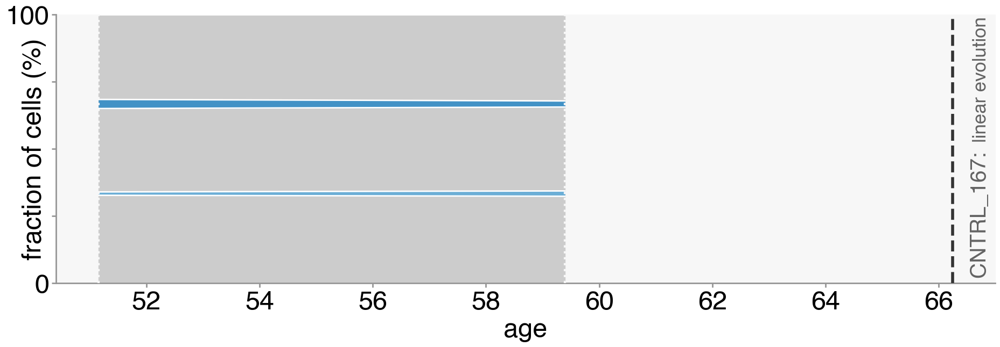

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


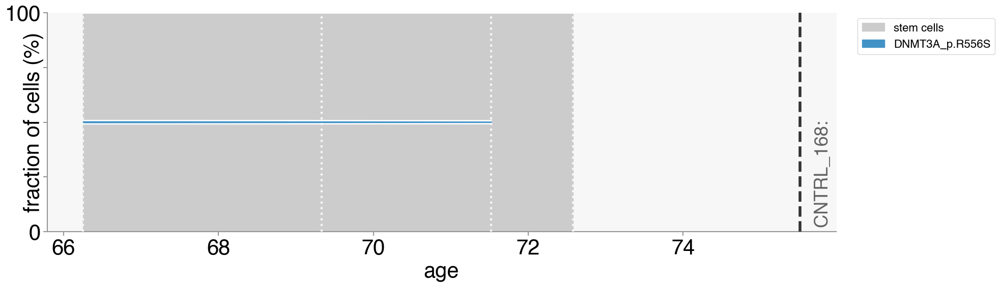

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


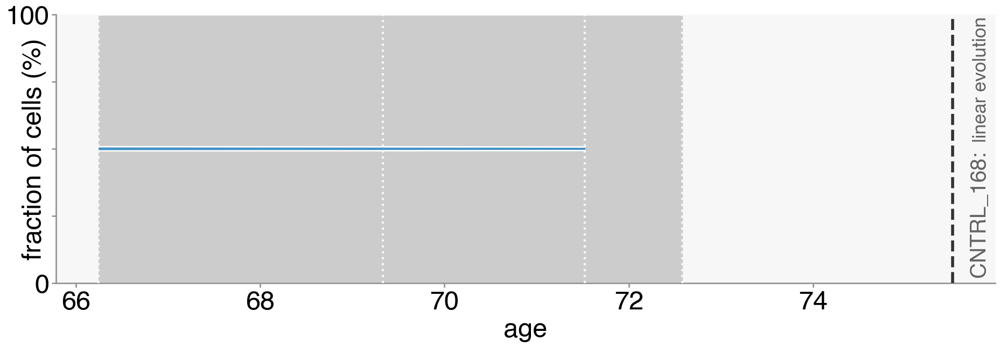

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


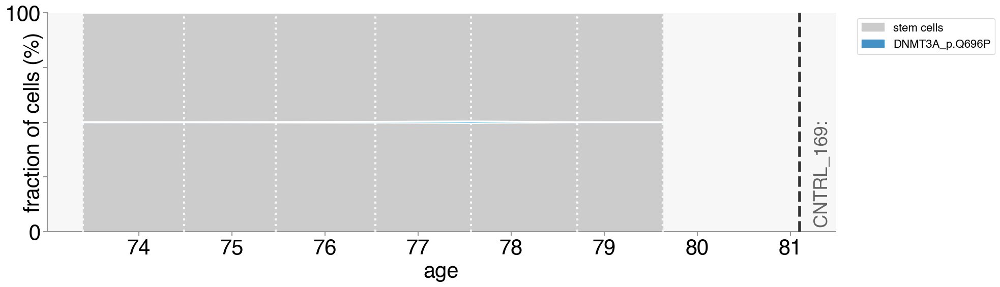

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


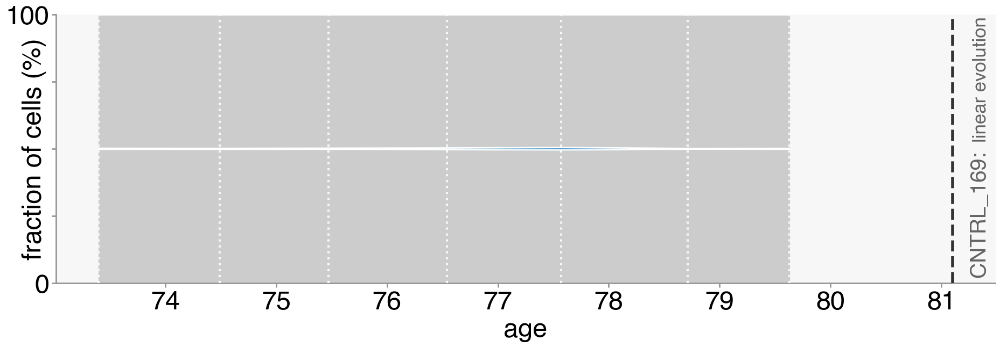

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


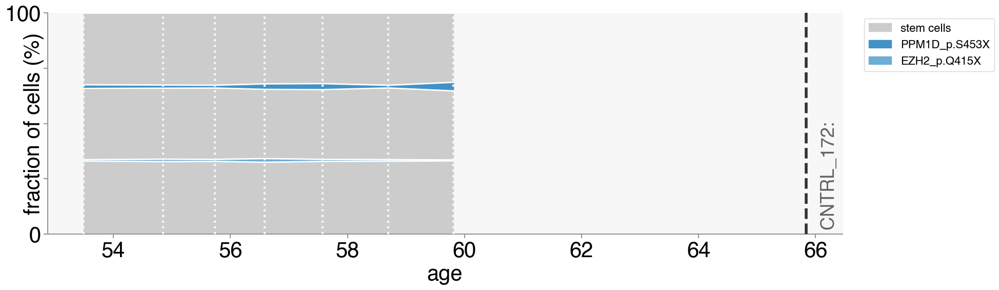

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


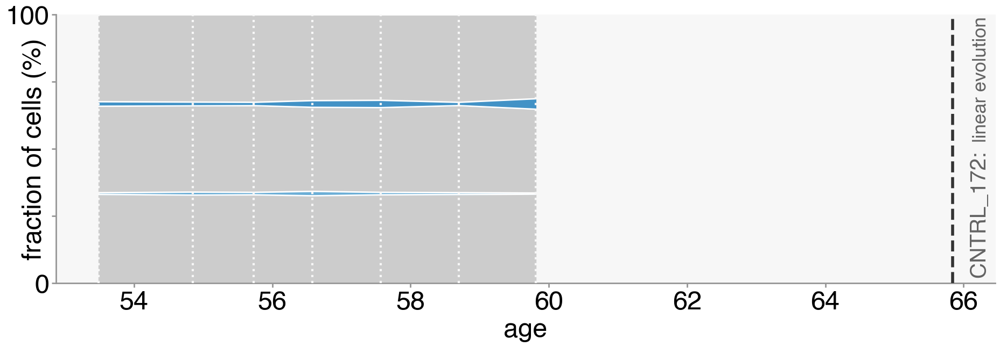

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


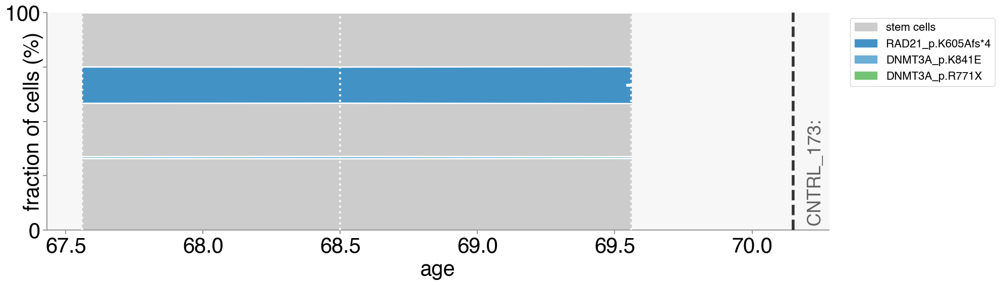

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


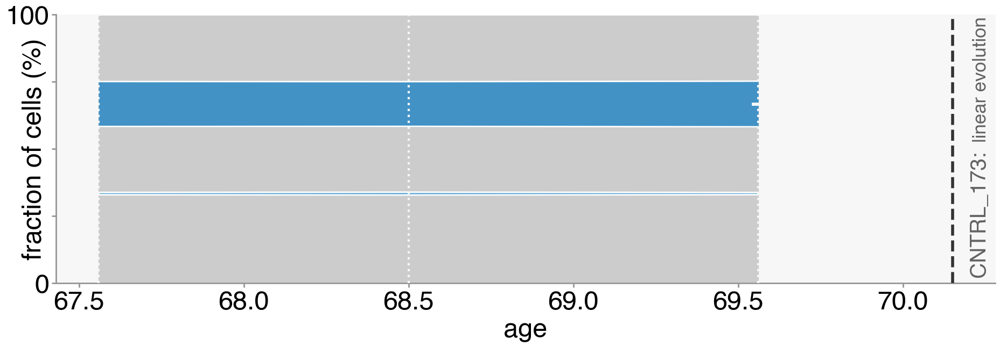

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


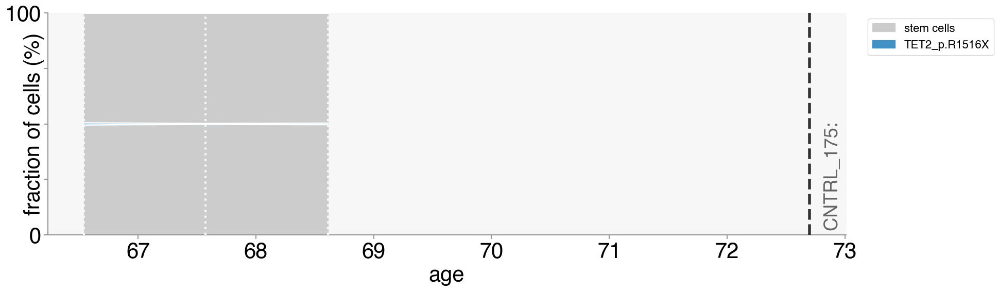

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


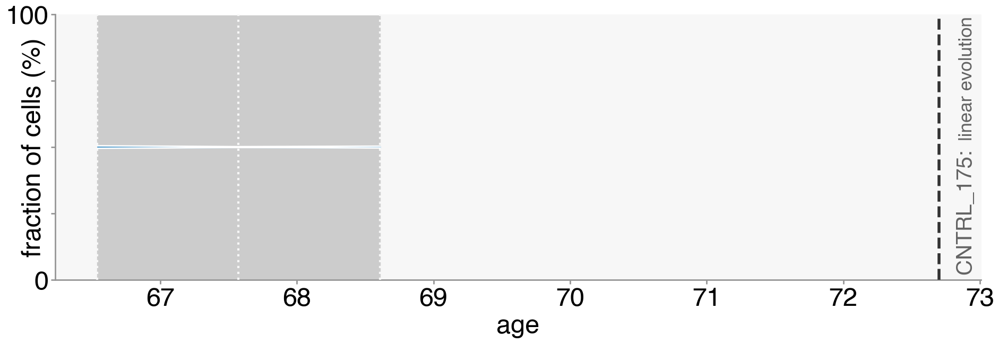

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


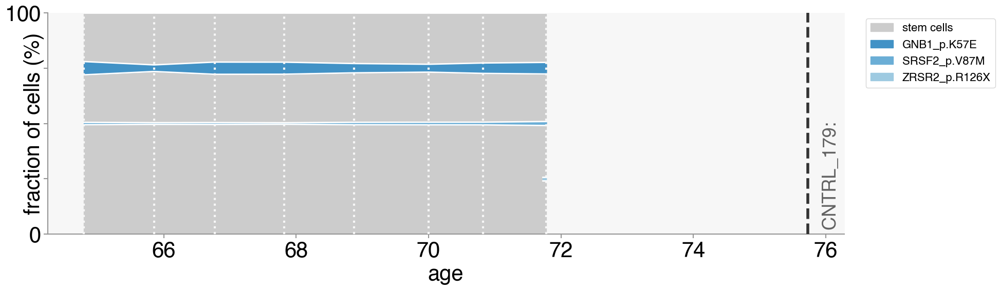

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


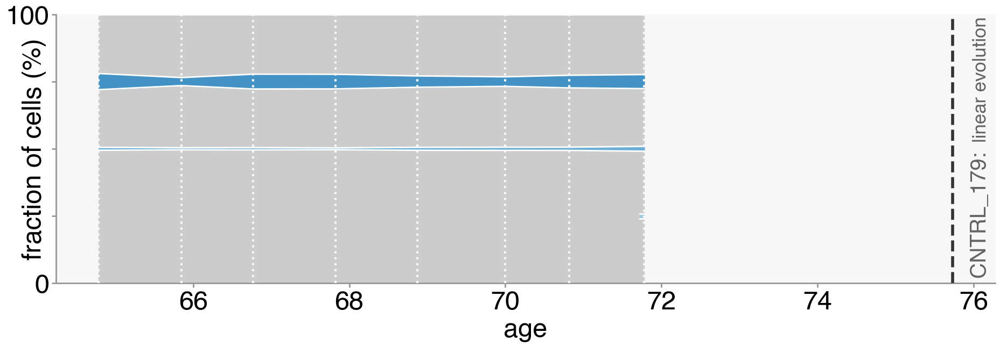

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


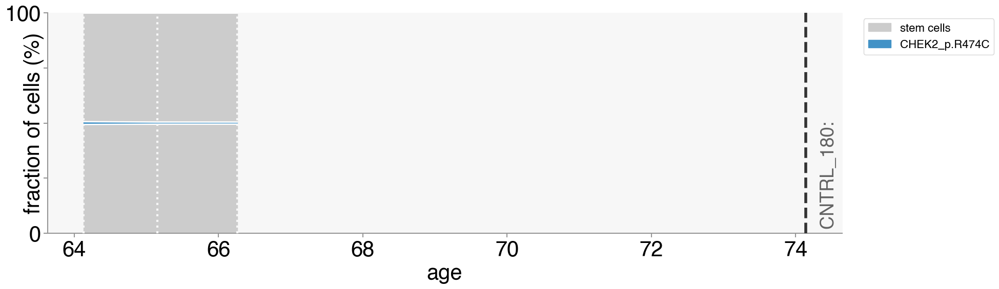

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


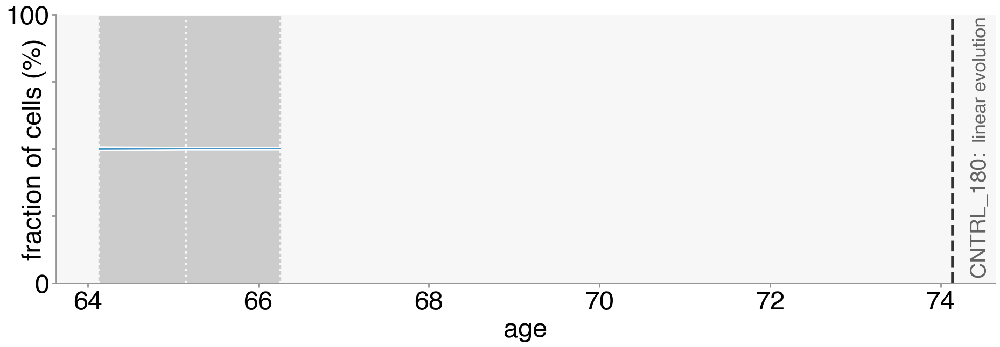

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


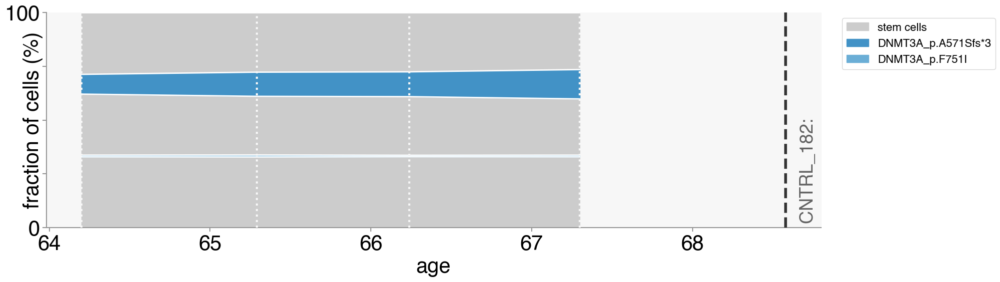

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


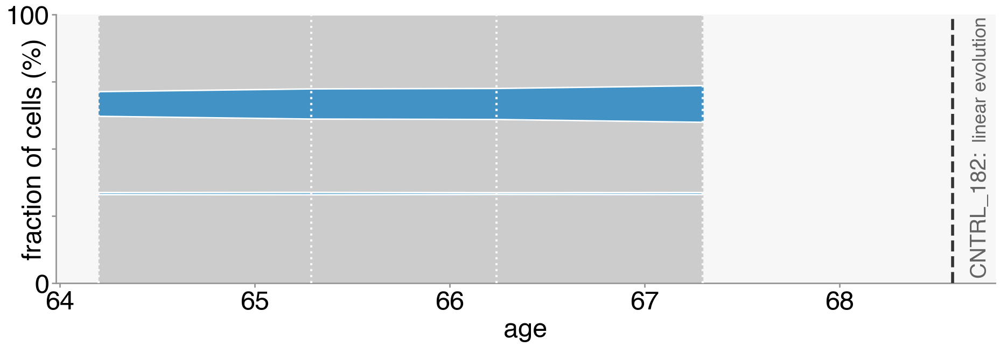

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


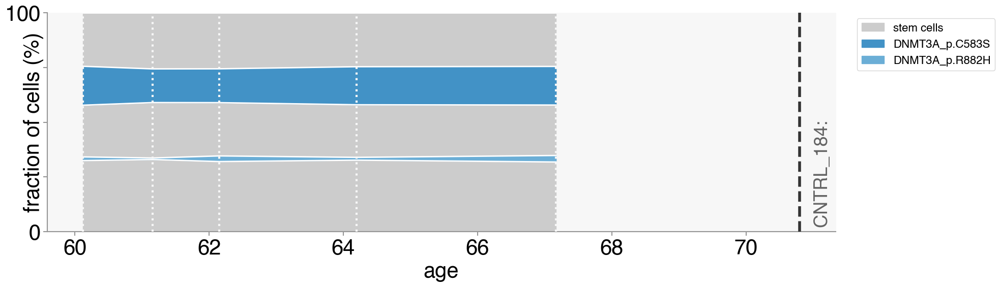

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


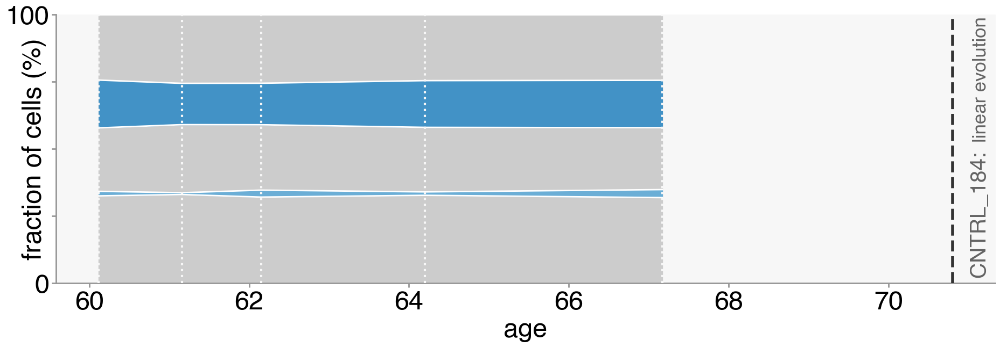

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


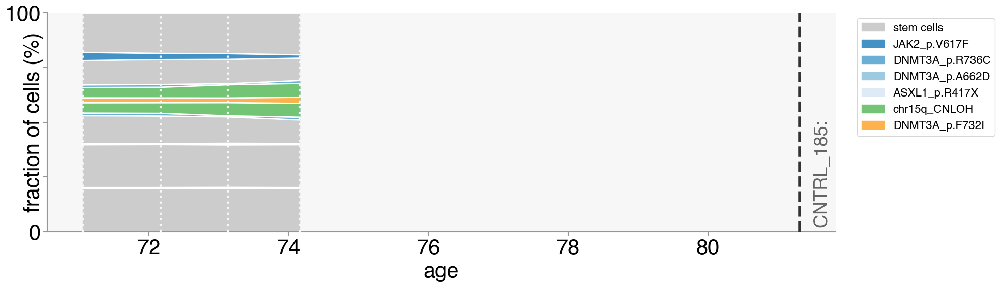

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


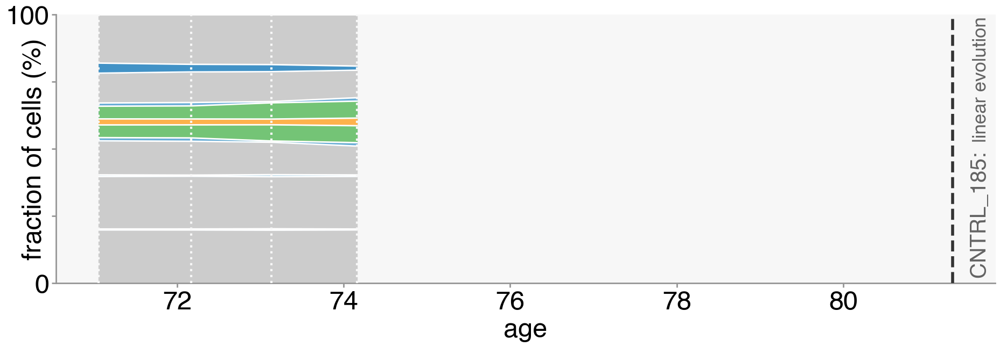

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


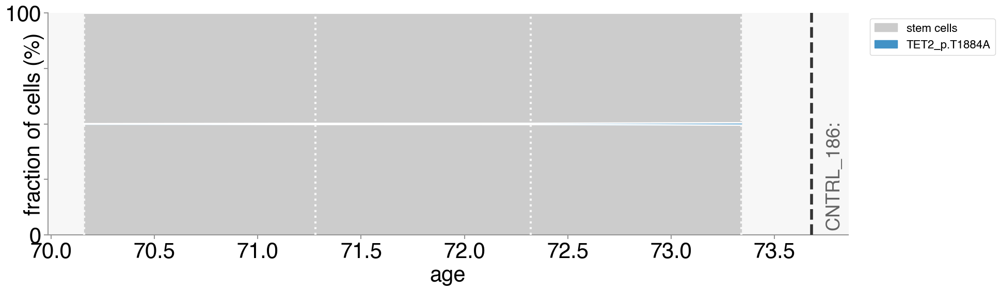

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


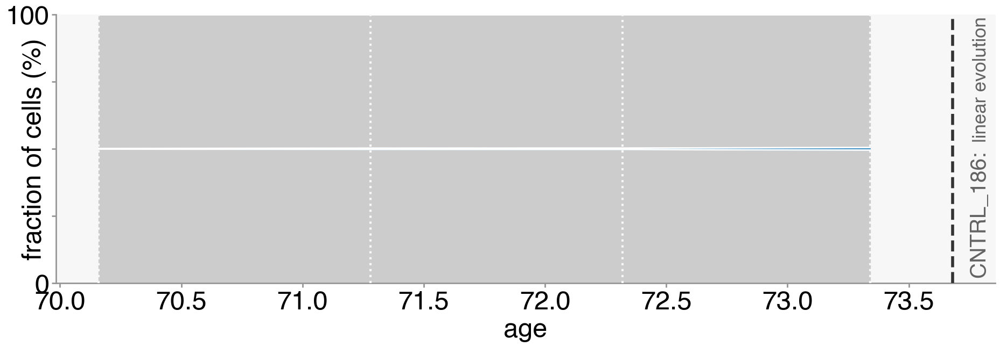

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


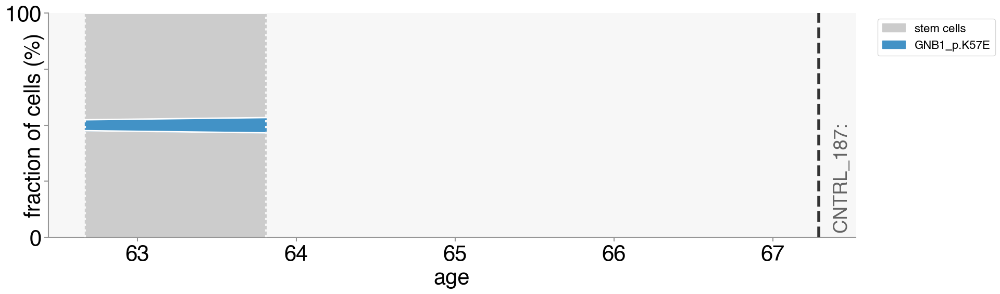

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


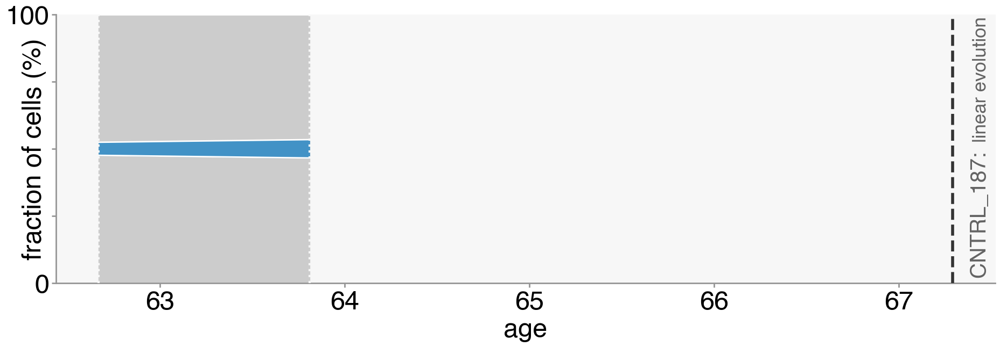

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


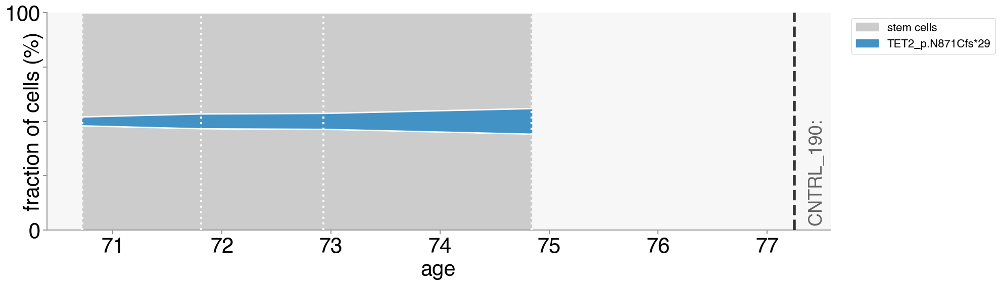

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


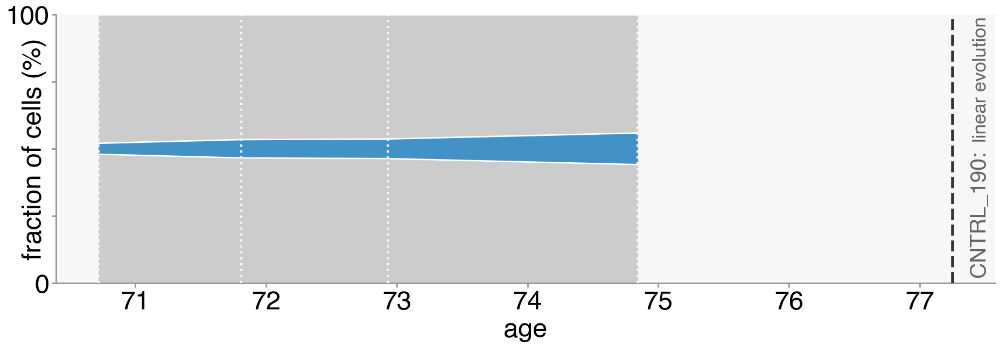

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


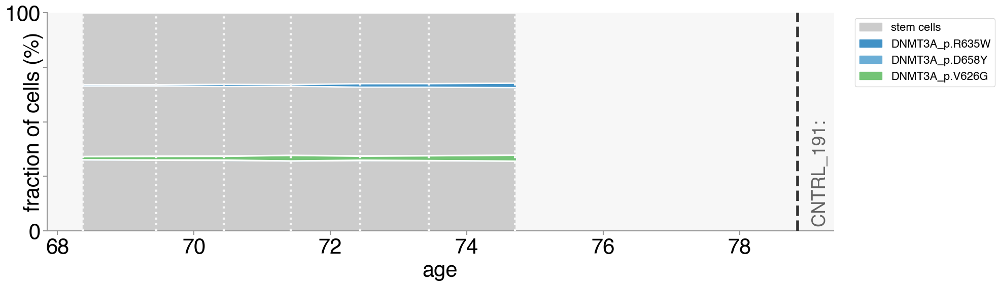

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


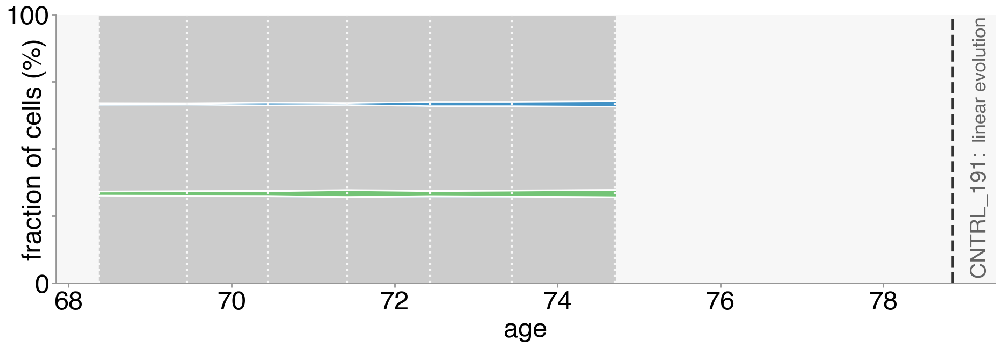

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


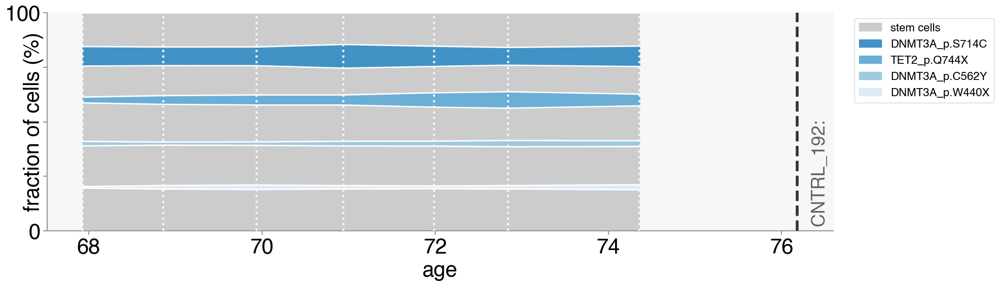

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


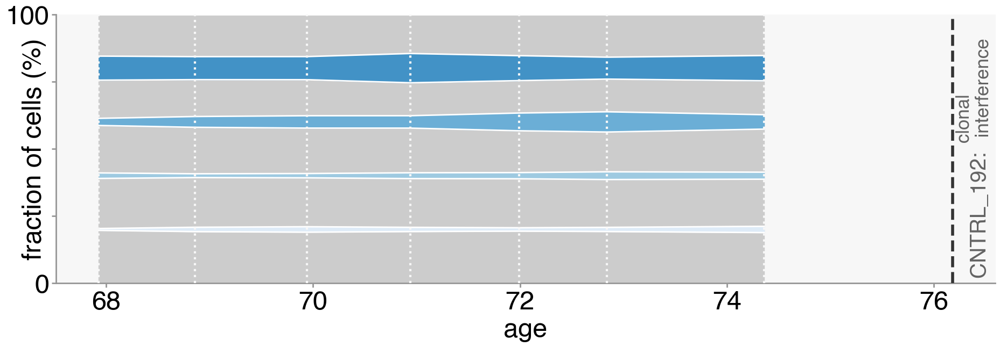

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


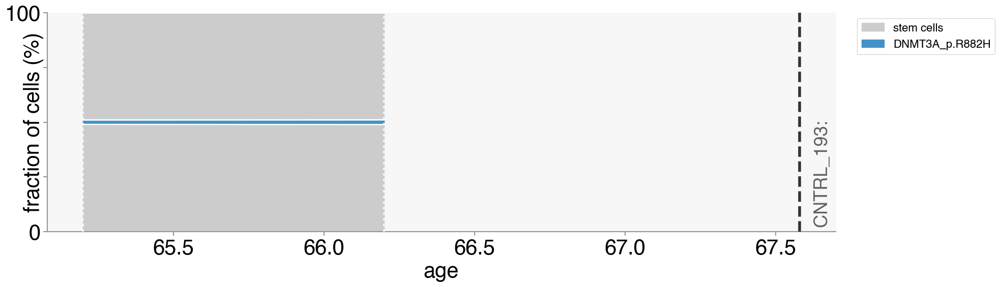

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


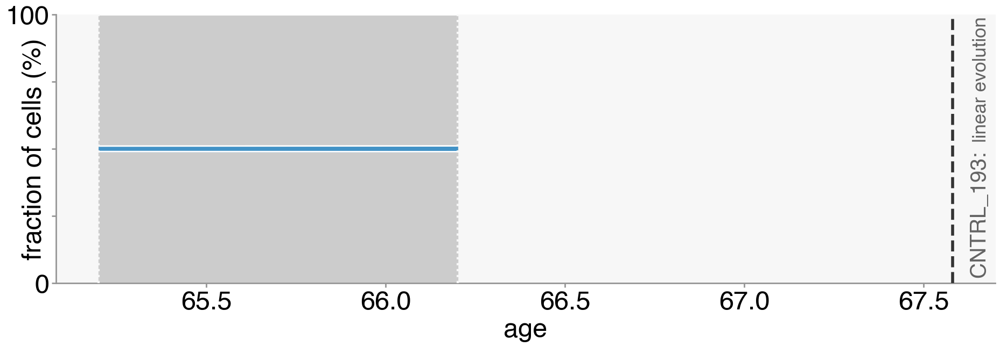

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


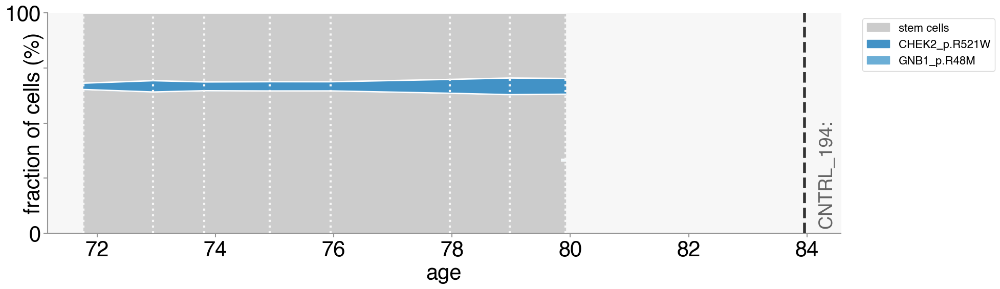

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


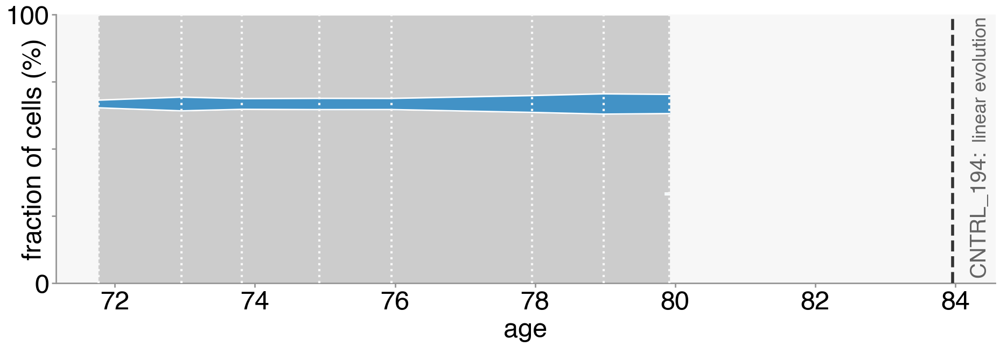

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


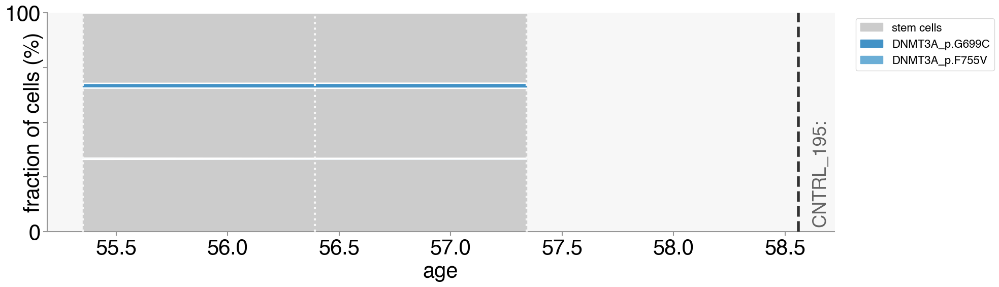

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


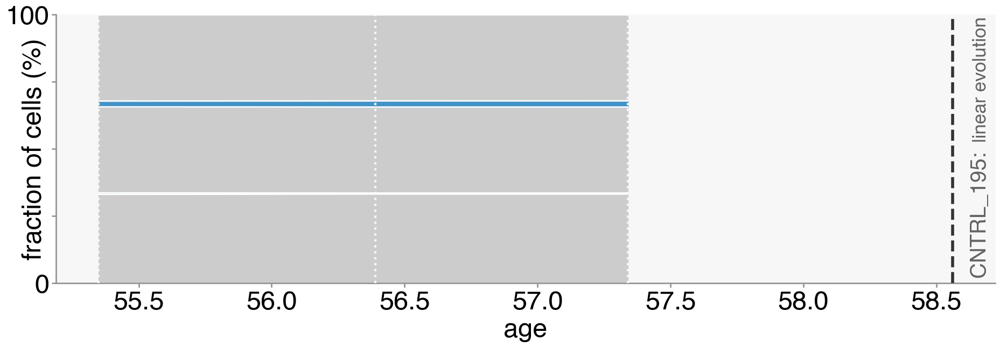

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


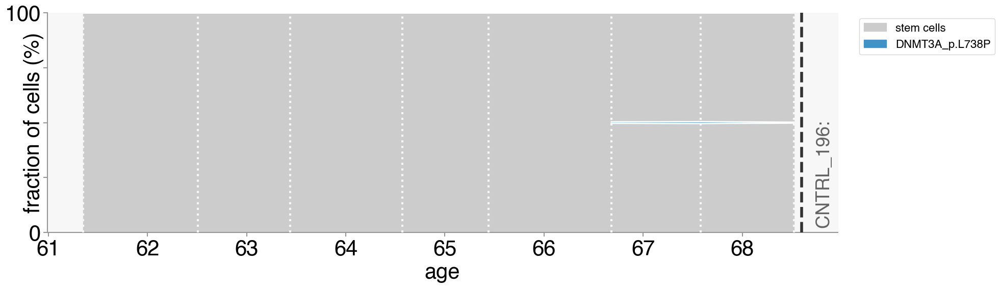

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


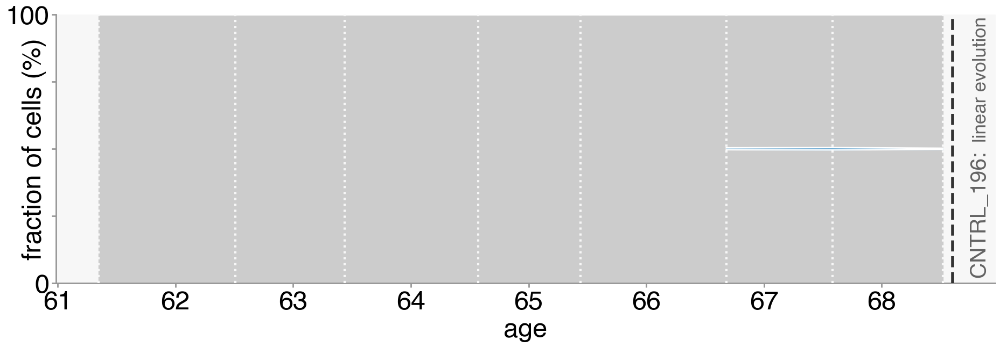

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


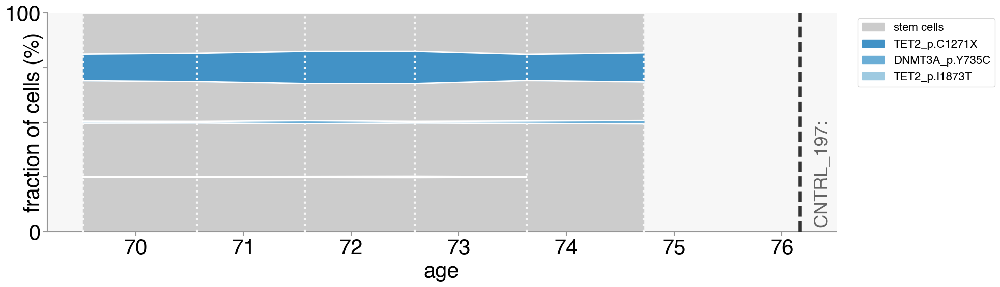

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


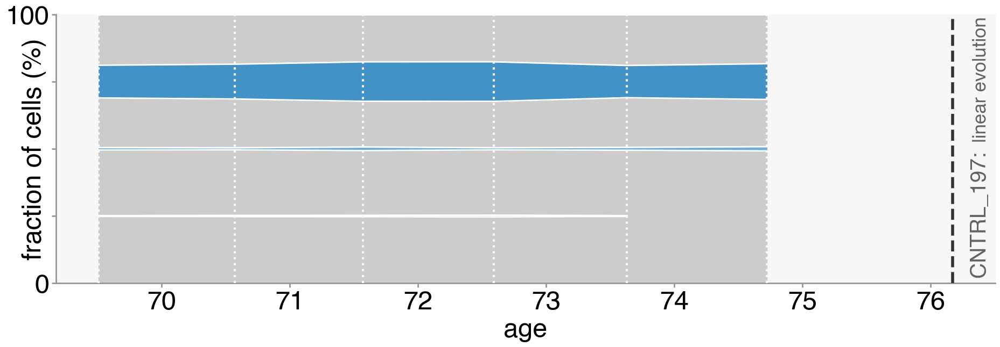

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


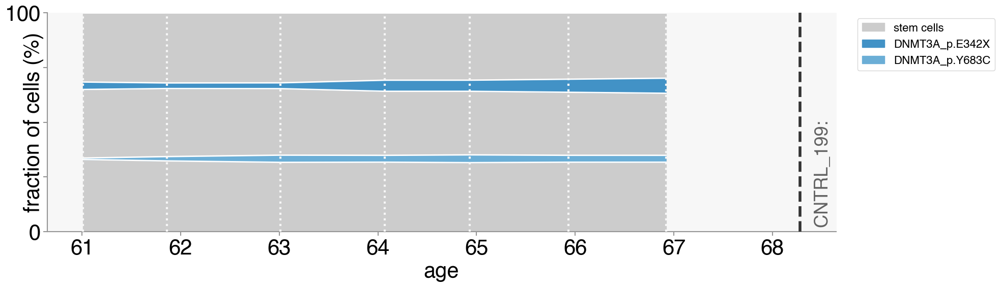

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


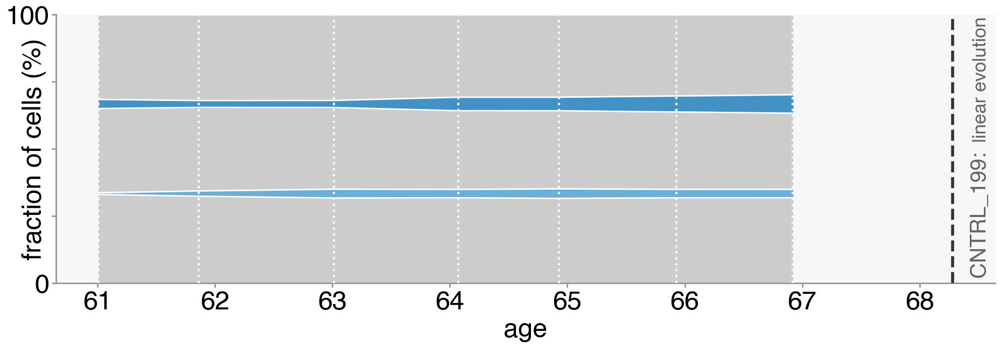

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


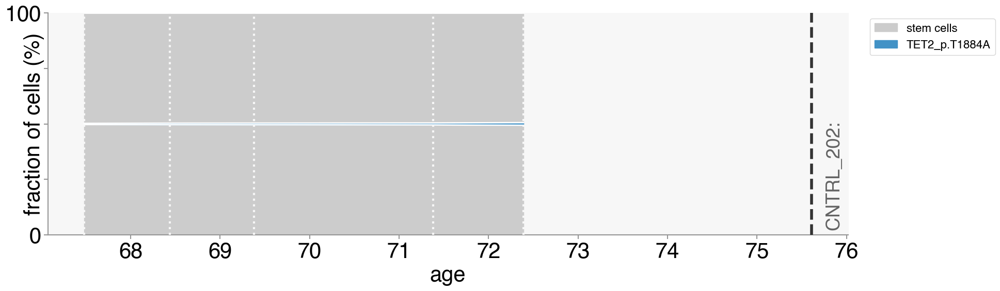

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


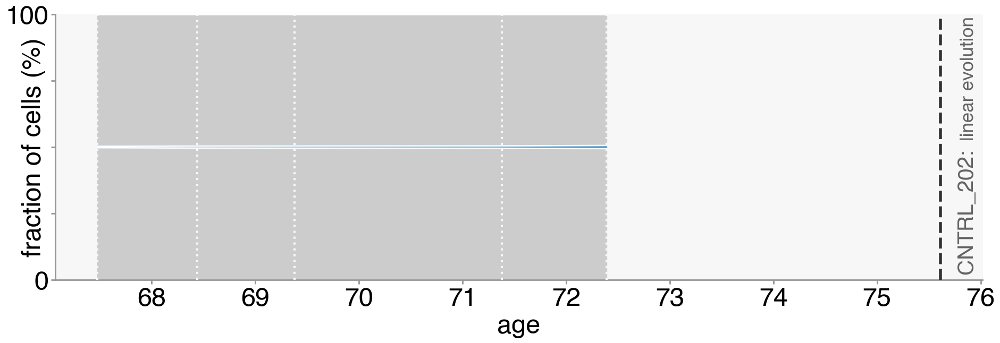

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


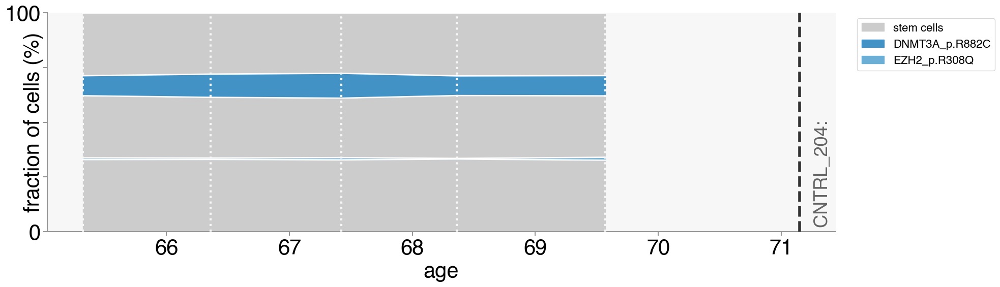

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


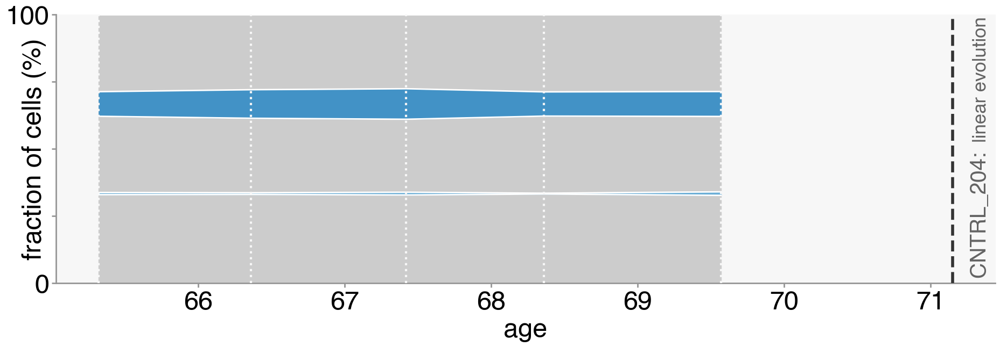

In [34]:
#Controls which don't need midline adjustment
controls_without_variants = []

for sample_name in controls:
    try:
        ages_list = sample_ages_sorted[sample_name]
        diagnosis_age = sample_diagnosis_age[sample_name]
        phylogeny = retrieve_phylogeny(sample_name)
        phylogeny = add_midline_shift(phylogeny, [0, 0, 0, 0, 0, 0, 0, 0])
        phylogeny = assign_clone_colours(phylogeny)
        timepoints = cell_fraction_timepoints(phylogeny, ages_list)
        Muller_plot_v3_muller_colours(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
        Muller_plot_v3_muller_colours_no_legend(timepoints, phylogeny, sample_name, diagnosis_age, other_history)
    except FileNotFoundError:
        controls_without_variants.append(sample_name)